In [3]:
import os
os.chdir("/opt/work/snRNAseq")
print(os.getcwd())
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import anndata as ad
import matplotlib.pyplot as plt
from matplotlib import rcParams

sc.set_figure_params(format='png')  # for beautified visualization
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params(style='scvelo',format='png')  # for beautified visualization

/opt/work/snRNAseq


In [ ]:
# samples = ["Pool","QUAD","TA","SOL","GFP","H2B","VEH4","VEH24","TAM4","TAM24","mSOL"]
samples = ["mSOL","H2B","VEH4","VEH24","TAM4","TAM24"]

adata = []
for i in range(0,len(samples)):
    adata.append(scv.read_loom('Data/'+samples[i]+'/velocyto/'+samples[i]+'.loom',validate=False))
    adata[i].var_names_make_unique()
#     results_file = 'Data/'+samples[i]+'/velocyto/'+samples[i]+'_pp.h5ad'
#     adata.append(scv.read(results_file))
adata_concat = ad.AnnData.concatenate(adata[0],adata[1],adata[2],adata[3],adata[4],adata[5],batch_categories=samples)
results_file = 'Data/Harmony_integrated_5month_trial2.h5ad'
adata_concat.write(results_file)

In [77]:
results_file = 'Data/Harmony_integrated_5month_trial2.h5ad'
adata=scv.read(results_file)
# adata=adata_concat.copy()
sc.pp.filter_cells(adata, min_genes=200)
# sc.pp.filter_cells(adata, max_genes=3000)
sc.pp.filter_genes(adata, min_cells=3)
adata.var['mt'] = adata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
adata = adata[adata.obs.n_genes_by_counts < 3000, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=3000)
adata.raw = adata
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts','n_genes_by_counts','pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata)

Trying to set attribute `.var` of view, copying.
... storing 'Chromosome' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Strand' as categorical


In [93]:
# adata.var.highly_variable
# sum(adata.var_names=='Ttn')
# adata

In [89]:
kwargs=dict(verbose=True,plot_convergence=True,max_iter_kmeans=25)
sc.external.pp.harmony_integrate(adata,key='batch',**kwargs)

2020-10-29 08:09:15,275 - harmonypy - INFO - Iteration 1 of 25
2020-10-29 08:09:22,511 - harmonypy - INFO - Iteration 2 of 25
2020-10-29 08:09:29,676 - harmonypy - INFO - Iteration 3 of 25
2020-10-29 08:09:36,975 - harmonypy - INFO - Iteration 4 of 25
2020-10-29 08:09:43,447 - harmonypy - INFO - Iteration 5 of 25
2020-10-29 08:09:48,906 - harmonypy - INFO - Iteration 6 of 25
2020-10-29 08:09:52,885 - harmonypy - INFO - Iteration 7 of 25
2020-10-29 08:09:55,260 - harmonypy - INFO - Converged after 7 iterations
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


In [92]:
# adata.raw.to_adata()

In [91]:
# adata.var.highly_variable

In [94]:
sc.pp.neighbors(adata,use_rep='X_pca_harmony',n_neighbors=30, n_pcs=50)
sc.tl.leiden(adata,resolution=1)
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)
sc.tl.umap(adata, init_pos='paga')

In [104]:
adata.write('Data/Harmony_integrated_5month_trial2_leiden.h5ad')
adata_concat=adata.copy()

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


In [43]:
results_file = 'Data/Harmony_integrated_5month_trial2_leiden.h5ad'
adata=scv.read(results_file)
adata_concat=adata.copy()

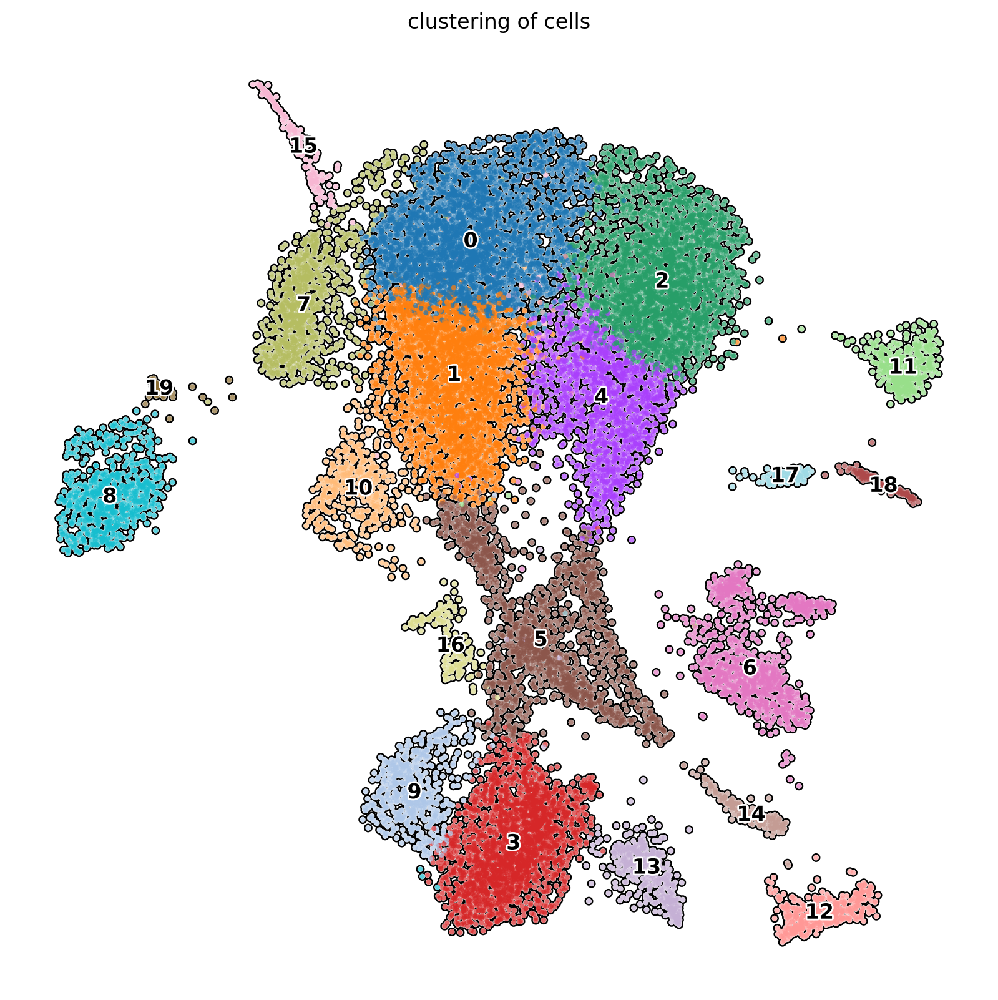

In [98]:
rcParams['figure.figsize'] = 10, 10
sc.pl.umap(adata_concat, color='leiden', add_outline=True, legend_loc='on data',
           legend_fontsize=12, legend_fontoutline=2,frameon=False, size=35,
           title='clustering of cells')

In [205]:
leiden_labels = ["0","1","2","3","4",
                 "5","6","7","8","9",
                 "10","11","12","13","14",
                 "15","16","17","18","19"]
adata_concat.rename_categories('leiden', leiden_labels)

In [241]:
adata.tmp = adata_concat.copy()
sc.tl.leiden(adata.tmp,restrict_to=('leiden',['16']),resolution=0.5)
adata.tmp.obs['leiden'] = adata.tmp.obs['leiden_R']

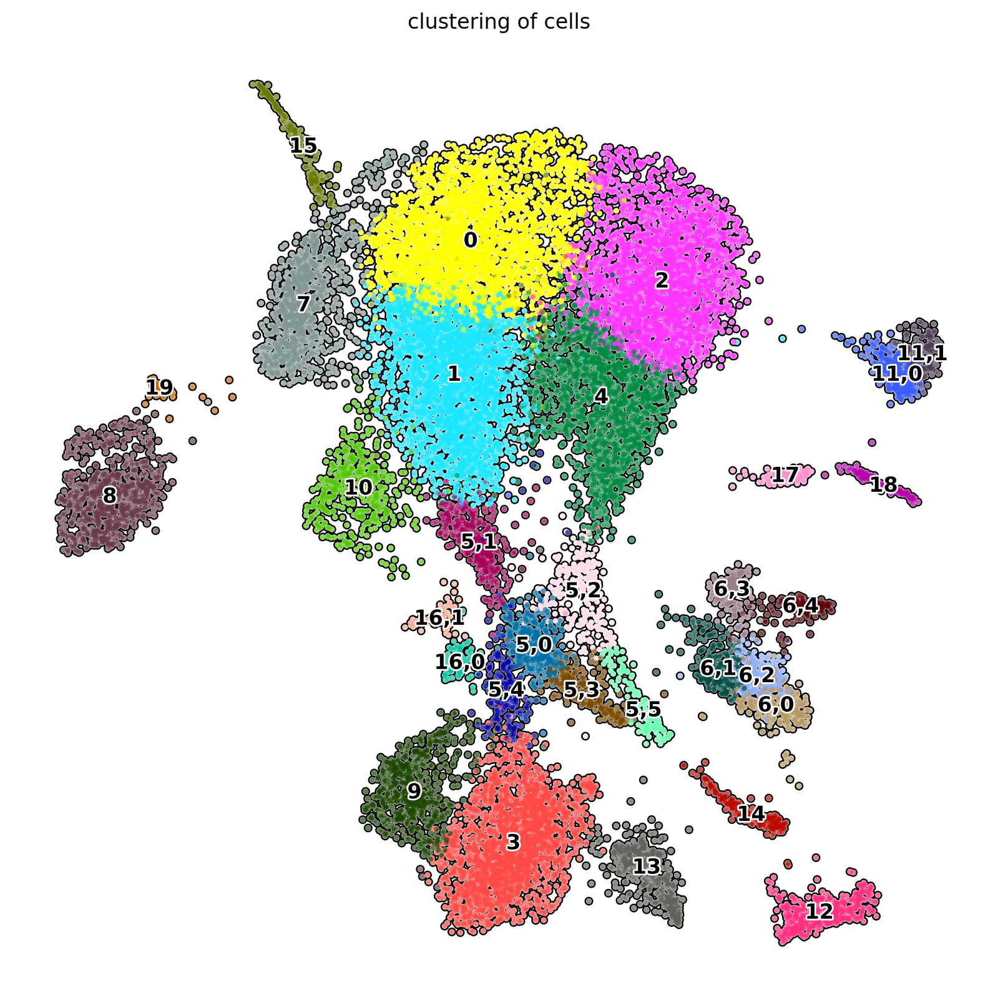

In [266]:
sc.tl.leiden(adata_concat,restrict_to=('leiden',['11']),resolution=0.5)
# adata.tmp.obs['leiden'] = adata_concat.obs['leiden_R']
sc.pl.umap(adata_concat, color='leiden_R', add_outline=True, legend_loc='on data',
           legend_fontsize=12, legend_fontoutline=2,frameon=False, size=35,
           title='clustering of cells')

In [268]:
sc.tl.rank_genes_groups(adata_concat,'leiden_R',method='wilcoxon',n_genes=200)
result = adata_concat.uns['rank_genes_groups']
groups = result['names'].dtype.names
res = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges','pvals','pvals_adj']})
res.to_csv('integrated_cluster_genes_subcluster1.csv')

In [242]:
sc.tl.leiden(adata.tmp,restrict_to=('leiden',['5']),resolution=0.8)
adata.tmp.obs['leiden'] = adata.tmp.obs['leiden_R']
sc.tl.leiden(adata.tmp,restrict_to=('leiden',['6']),resolution=0.8)
adata.tmp.obs['leiden'] = adata.tmp.obs['leiden_R']

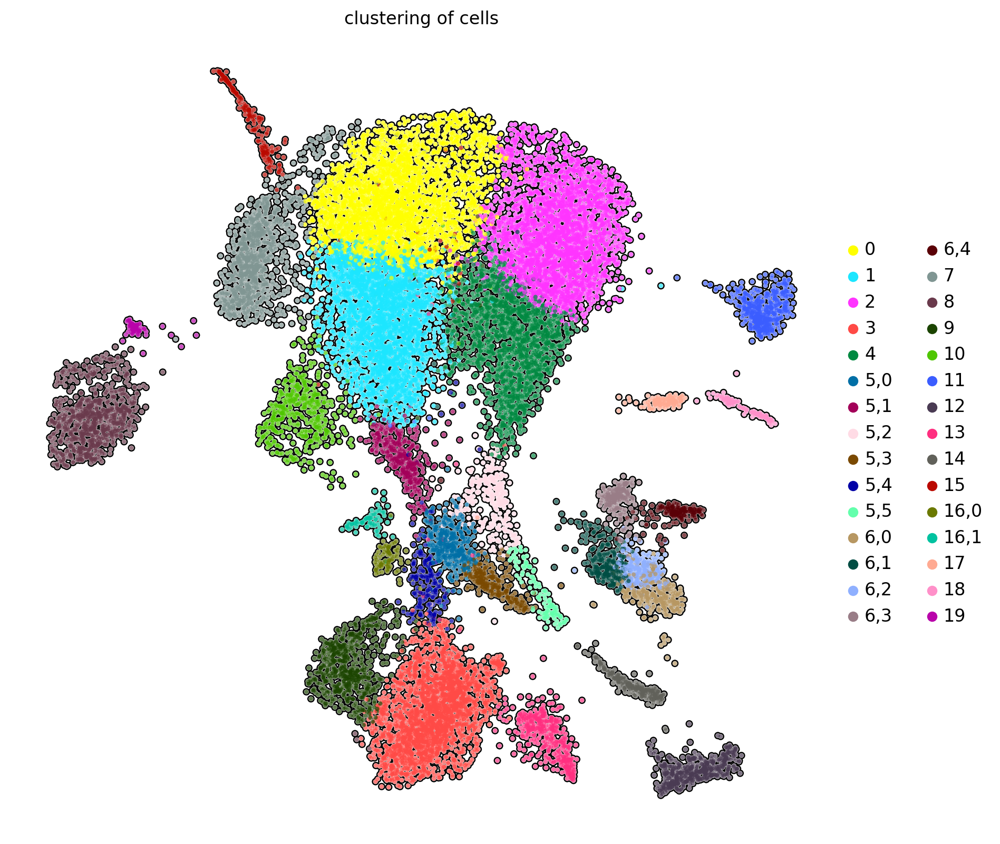

In [378]:
rcParams['figure.figsize'] = 10, 10
# sc.pl.umap(adata.tmp, color='leiden', add_outline=True, legend_loc='on data',
#            legend_fontsize=12, legend_fontoutline=2,frameon=False, size=35,
#            title='clustering of cells')
sc.pl.umap(adata_subclust, color='leiden', add_outline=True,
           legend_fontsize=12, legend_fontoutline=2,frameon=False, size=35,
           title='clustering of cells')

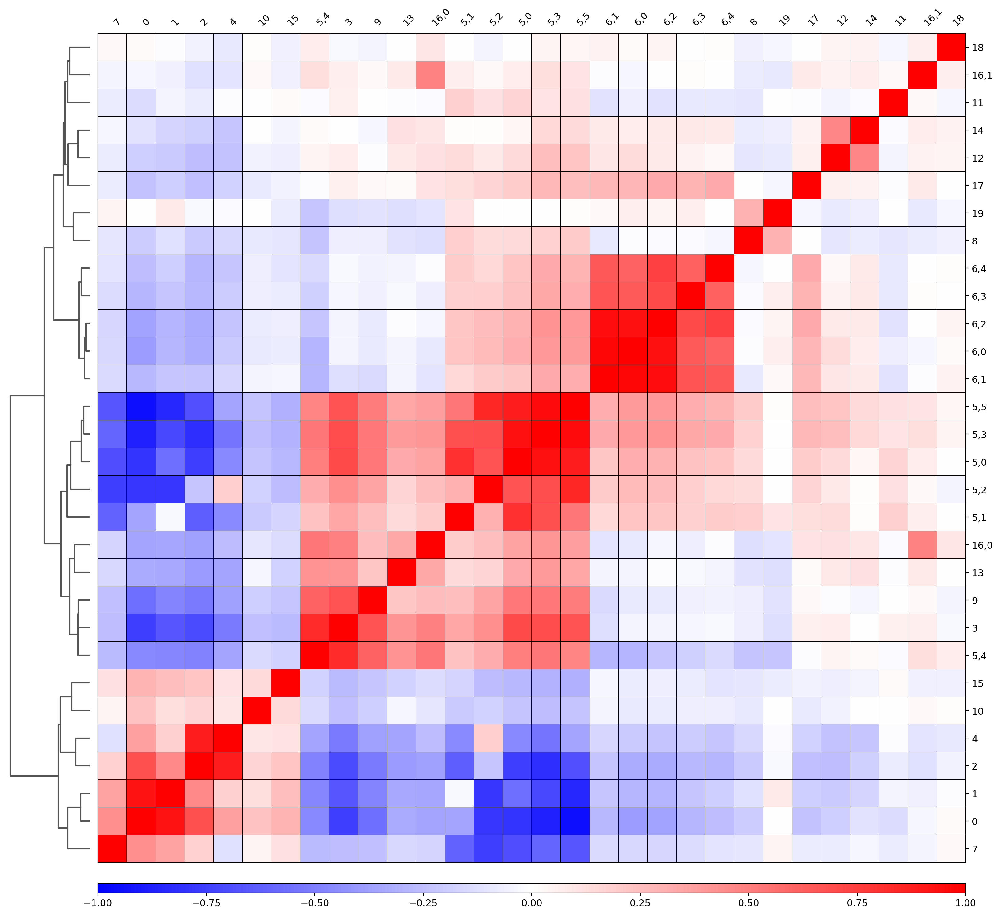

In [573]:
rcParams['figure.figsize'] = 2.5, 2.5
# sc.pl.umap(adata_subclust, color=['Atxn1','Cd34','Prom1','Pdgfra'], ncols=2, size=25) # Prom1=CD133, Atxn1=Sca-1
# sc.pl.umap(adata_subclust, color=['Atxn1','Cd34','Ncam1','Cdh15'], ncols=2, size=25) # Ncam1=C56, Cdh15=CD144
#sc.pl.umap(adata_subclust, color=['Wnt4','Wfs1','Tnks2','Gm48752'], ncols=2, size=25) # 
sc.pl.correlation_matrix(adata_subclust,groupby='leiden')

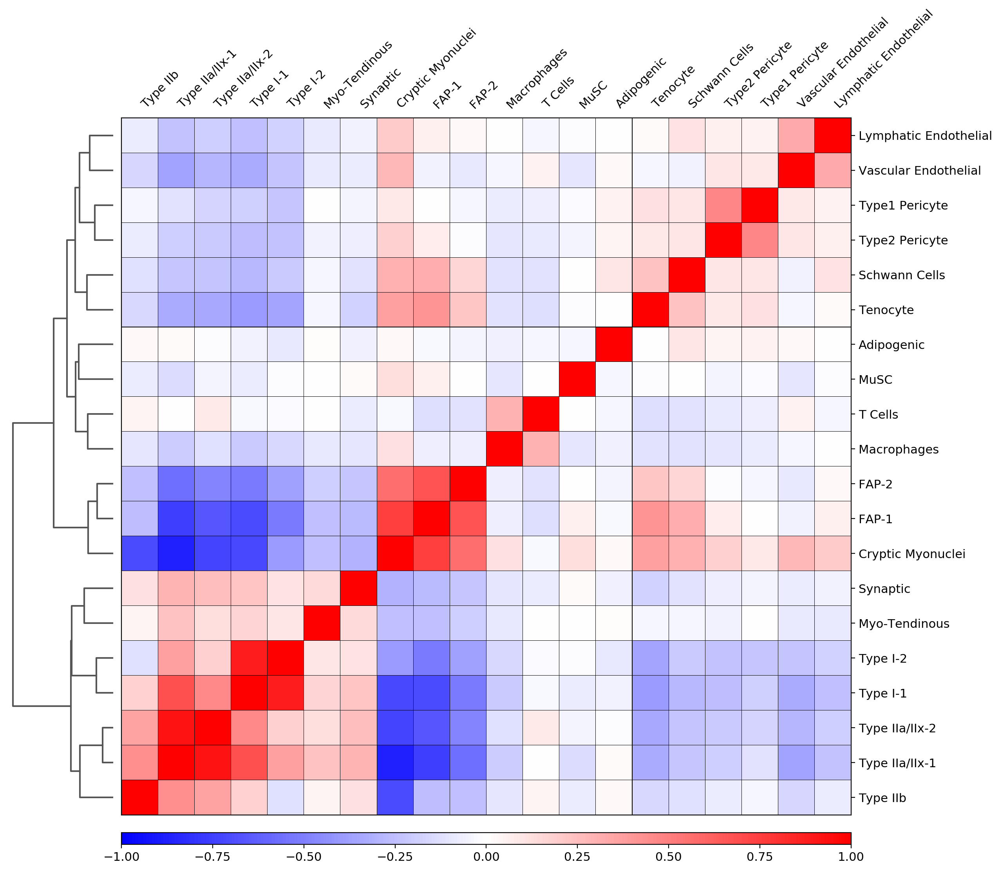

In [141]:
sc.pl.correlation_matrix(adata_concat,groupby='leiden')

In [318]:
# adata_saving_progress = adata_concat.copy() # saved progress 10:28AM 10/29 - 20 clusters in leiden
# adata_saving_progress1 = adata_concat.copy() # saved progress 9:03PM 10/29 - 30 clusters in leiden (5,6,16), 31 in leiden_R (SC)
# adata_saving_progress1.write('Data/Harmony_integrated_5month_trial2_leiden_R.h5ad')
# adata_concat=adata_saving_progress.copy()
# adata_concat=adata.tmp.copy()

In [250]:
# set(adata.tmp.obs['leiden'])
sc.tl.rank_genes_groups(adata.tmp,'leiden',method='wilcoxon',n_genes=200)
result = adata.tmp.uns['rank_genes_groups']
groups = result['names'].dtype.names
res = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges','pvals','pvals_adj']})
res.to_csv('integrated_cluster_genes_subcluster.csv')

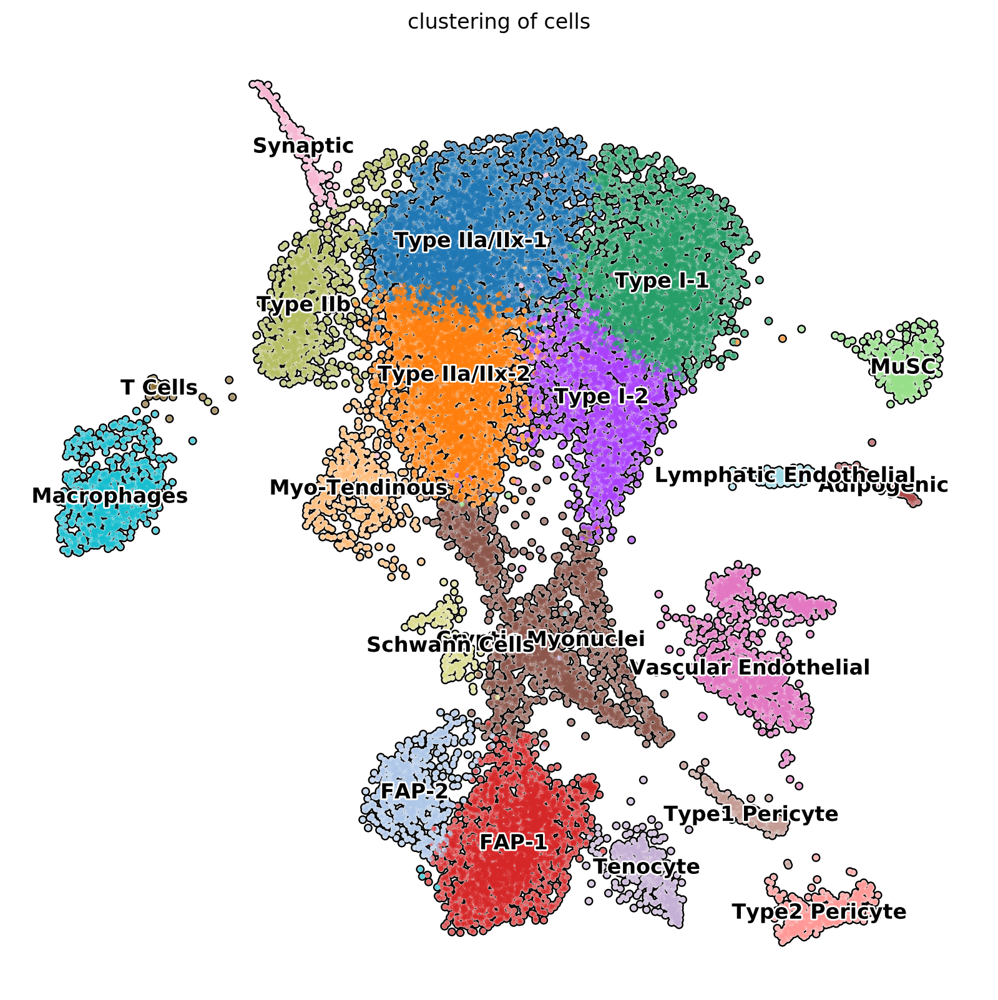

In [140]:
rcParams['figure.figsize'] = 10, 10
cluster_labels = ["Type IIa/IIx-1","Type IIa/IIx-2","Type I-1","FAP-1","Type I-2",
                 "Cryptic Myonuclei","Vascular Endothelial","Type IIb","Macrophages","FAP-2",
                 "Myo-Tendinous","MuSC","Type2 Pericyte","Tenocyte","Type1 Pericyte",
                 "Synaptic","Schwann Cells","Lymphatic Endothelial","Adipogenic","T Cells"]
adata_concat.rename_categories('leiden', cluster_labels)
sc.pl.umap(adata_concat, color='leiden', add_outline=True, legend_loc='on data',
           legend_fontsize=12, legend_fontoutline=2,frameon=False, size=35,
           title='clustering of cells')

In [252]:
sc.tl.embedding_density(adata_concat, groupby='batch')

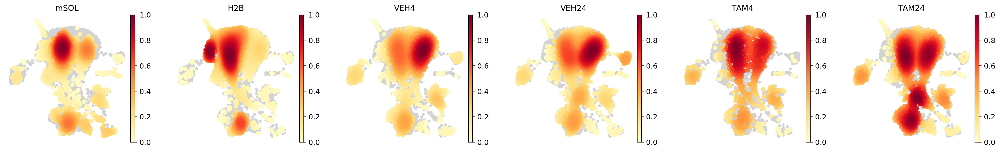

In [253]:
rcParams['figure.figsize'] = 3.5, 3.5
sc.pl.embedding_density(adata_concat, groupby='batch',ncols=6,frameon=False)

In [337]:
sc.tl.rank_genes_groups(adata_concat,'leiden',method='wilcoxon',n_genes=200)
result = adata_concat.uns['rank_genes_groups']
groups = result['names'].dtype.names

In [108]:
res = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges','pvals','pvals_adj']})
res.to_csv('integrated_cluster_genes.csv')

In [402]:
# adata_concat = adata_concat[:, adata_concat.var.highly_variable]
# sc.pp.regress_out(adata_concat, ['total_counts','n_genes_by_counts','pct_counts_mt'])
# sc.pp.scale(adata_concat, max_value=10)
# sc.tl.dendrogram(adata_concat,groupby='leiden')
# sc.tl.pca(adata_concat)
# adata_subclust.obs['Clusters']
# adata_subclust.obs['leiden_R']
# adata_subclust.obs

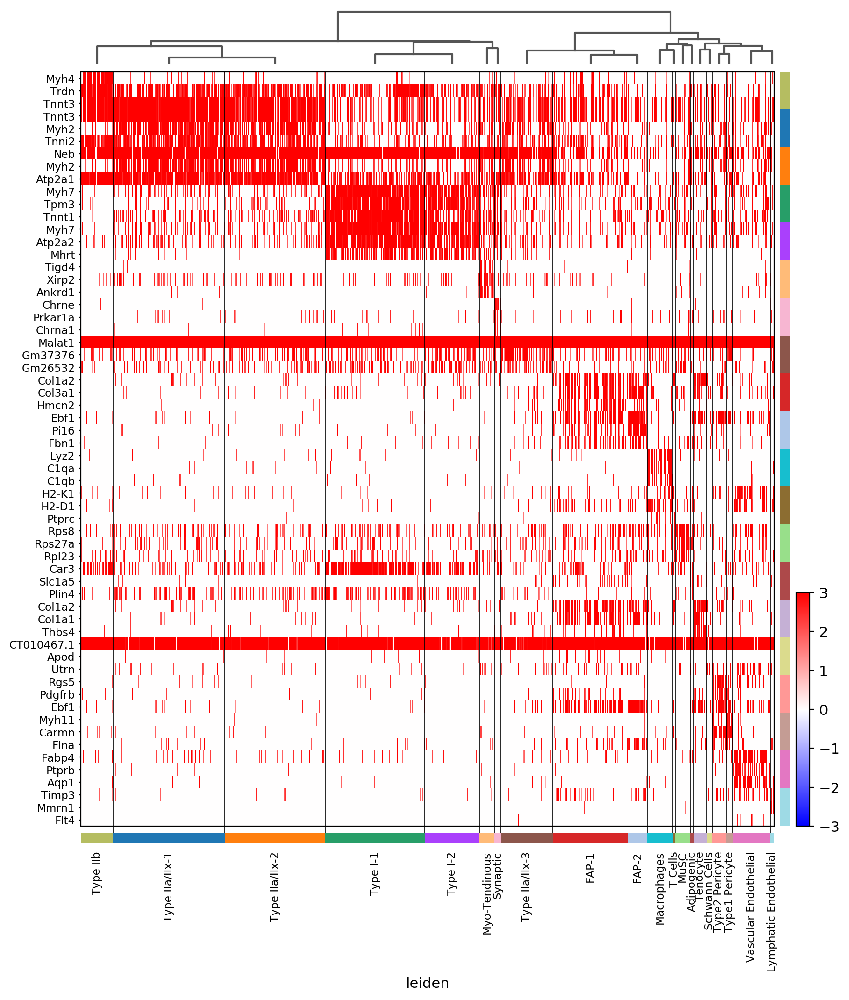

In [397]:
rcParams['figure.figsize'] = 10, 15
rcParams['font.size'] = 10
marker_genes = ['Myh1','Myh2','Myh4','Myh7']
# sc.pl.stacked_violin(adata_concat,marker_genes,groupby='leiden',rotation=90)
# sc.pl.rank_genes_groups_stacked_violin(adata_concat,n_genes=3)
sc.pl.rank_genes_groups_heatmap(adata_concat, n_genes=3,swap_axes=True, 
                                vmin=-3, vmax=3,cmap='bwr',groupby='leiden',
                                show_gene_labels=True,save="_marker_heatmap")
# sc.pl.umap(adata_concat, color=marker_genes, ncols=1)

In [134]:
gene='Myh8'
thresh=0
samples = ["mSOL","H2B","VEH4","VEH24","TAM4","TAM24"]
dataset = []
for batch in samples:
    mSOL_myonuc = adata_subclust[adata_subclust.obs['batch'].isin([batch]),:].copy()
    df = pd.DataFrame(mSOL_myonuc.obs['leiden'])
    df1 = pd.DataFrame((mSOL_myonuc.raw[:,gene].X).toarray(),index=df.index,columns=[gene])
    df=pd.concat([df,df1],axis=1)
#     df=df[df[gene]>thresh]
#     print(df.groupby(['leiden']).agg(['mean','count']))
    dataset.append(df)
# H2B_myonuc = adata_subclust[adata_subclust.obs['batch'].isin(['H2B']),:].copy()
# V4_myonuc = adata_subclust[adata_subclust.obs['batch'].isin(['VEH4']),:].copy()
# V24_myonuc = adata_subclust[adata_subclust.obs['batch'].isin(['VEH24']),:].copy()
# T4_myonuc = adata_subclust[adata_subclust.obs['batch'].isin(['TAM4']),:].copy()
# T24_myonuc = adata_subclust[adata_subclust.obs['batch'].isin(['TAM24']),:].copy()


In [138]:
genes=['Mymk','Mymx','Pax7','Myf5','Myod1','Myog','Myh3','Myh8']
dataset = []
for batch in samples:
    mSOL_myonuc = adata_subclust[adata_subclust.obs['batch'].isin([batch]),:].copy()
    df = pd.DataFrame(mSOL_myonuc.obs['leiden'])
    df1 = pd.DataFrame((mSOL_myonuc.raw[:,genes].X).toarray(),index=df.index,columns=genes)
    df=pd.concat([df,df1],axis=1)
#     df=df[df[gene]>thresh]
#     print(df.groupby(['leiden']).agg(['mean','count']))
    dataset.append(df)

In [139]:
# thresh=0
# samples = ["mSOL","H2B","VEH4","VEH24","TAM4","TAM24"]
# sum_table = []
# for i in range(0,len(samples)):
#     df=dataset[i]
#     # df[(df['Myh7']>thresh) & (df['Myh2']>thresh)]
#     df=df[(df[gene]>thresh)]
#     sum_table.append(df.groupby(['leiden']).agg(['mean','count']))
# pd.concat(sum_table,axis=1)
i=1
df=dataset[i]
# df=df[(df['Pax7']>2)&(df['Myf5']>1.5)]
df=df[(df['Myh8']>0)&(df['Myh3']>0)]
df

,leiden,Mymk,Mymx,Pax7,Myf5,Myod1,Myog,Myh3,Myh8
H2B:TCATACTTCGTGTGATx-H2B,13,0.0,0.0,0.0,0.0,1.477722,0.0,1.477722,1.477722


In [1017]:
samples = ["mSOL","H2B","VEH4","VEH24","TAM4","TAM24"]
sum_table = []
thresh=0
for i in range(0,len(samples)):
#     print(samples[i])
    df = dataset[i]
    df=df[(df[gene]>thresh)]
#     df=df[(df['Myh7']<=thresh) & (df['Myh2']>thresh+0.5)]
#     df=df[['leiden','Myh7']]
#     df=df[['leiden','Myh2']]
    sum_table.append(df.groupby(['leiden']).agg(['mean','count']))
#     print(df.groupby(['leiden']).agg(['mean','count']))
pd.concat(sum_table,axis=1)

Myh3                                                                  
        mean count  mean count  mean count  mean count  mean count  mean count
leiden                                                                        
0       2.09     6  2.37     3   NaN     0  1.71     1  1.72     2  2.77     3
1       1.89     2  1.90     3  2.48     3  2.43     3   NaN     0   NaN     0
2       2.45     2  2.00     4  1.97     5  2.43    16  1.37     1  2.11     6
3       3.50     2  0.91     1   NaN     0   NaN     0  1.86     2  3.01     1
4        NaN     0  1.48     1  1.90     5  2.41     6  1.16     2  2.20     2
5,0      NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
5,1      NaN     0   NaN     0   NaN     0  2.24     1   NaN     0   NaN     0
5,2      NaN     0  1.59     1   NaN     0   NaN     0   NaN     0   NaN     0
5,3      NaN     0   NaN     0   NaN     0   NaN     0   NaN     0  2.61     1
5,4      NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
5,5      NaN     0   NaN     0   NaN     0  1.52     2  1.27     2   NaN     0
6,0      NaN     0   NaN     0   NaN     0  2.44     1   NaN     0  2.09     1
6,1      NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
6,2      NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
6,3      NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
6,4      NaN     0  2.91     1   NaN     0   NaN     0   NaN     0   NaN     0
7        NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
8       1.64     1   NaN     0   NaN     0  3.49     2   NaN     0   NaN     0
9       3.43     1   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
10      2.59     7  2.03    10  2.70     1  2.51     3  1.46     1  1.89     1
11       NaN     0   NaN     0   NaN     0  2.19     2   NaN     0   NaN     0
12      1.73     1   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
13       NaN     0  1.56     2  1.52     1   NaN     0   NaN     0   NaN     0
14       NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
15       NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
16,0     NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
16,1     NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
17       NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
18       NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0
19       NaN     0   NaN     0   NaN     0   NaN     0   NaN     0   NaN     0

In [1003]:
# rcParams['figure.figsize'] = 7.5, 5


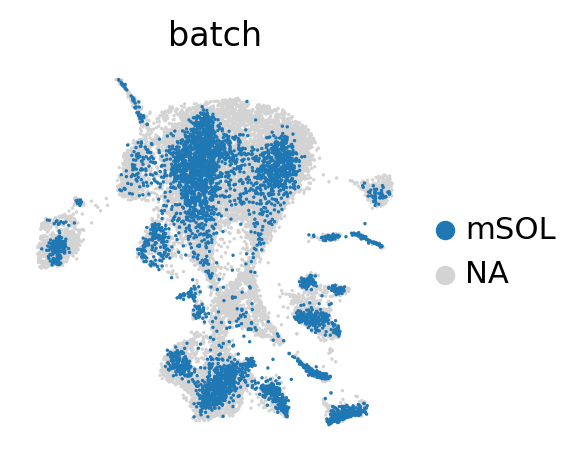

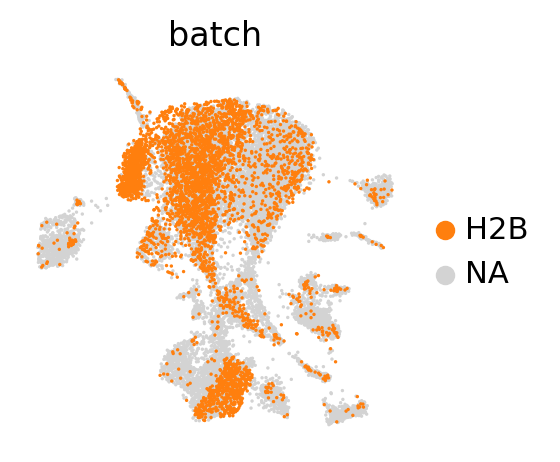

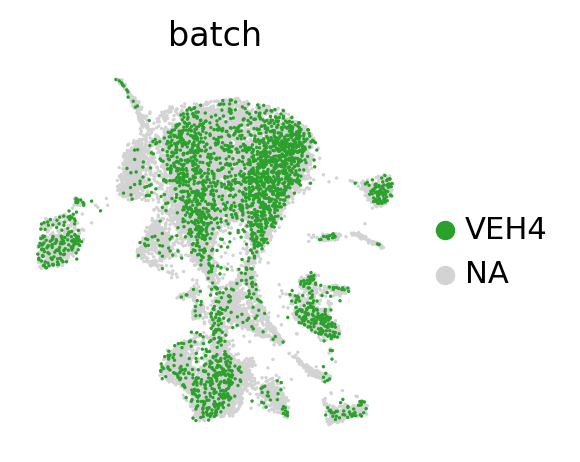

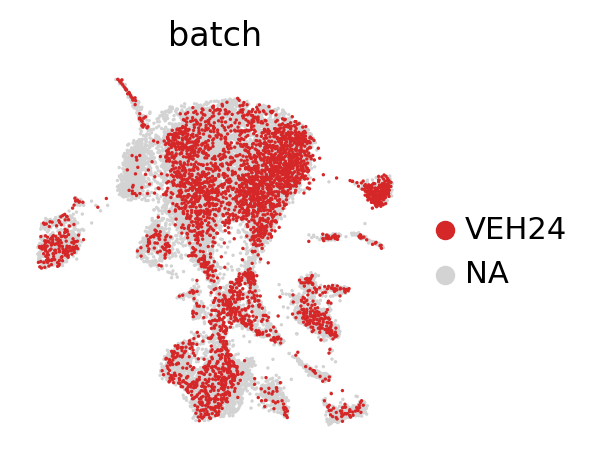

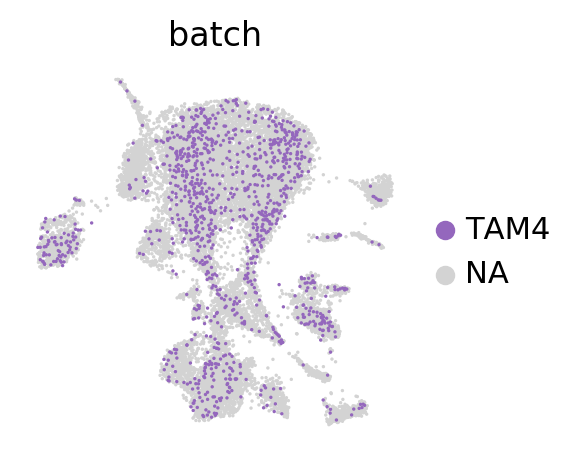

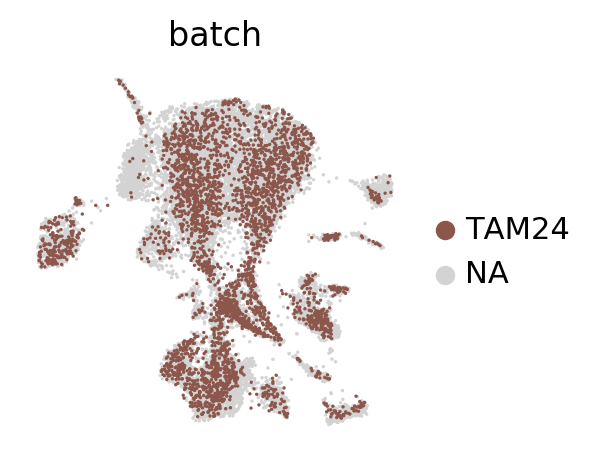

In [109]:
samples = ["mSOL","H2B","VEH4","VEH24","TAM4","TAM24"]
for batch in samples:
    sc.pl.umap(adata_concat, color='batch', groups=[batch],frameon=False)

In [4]:
results_file = 'Data/Harmony_integrated_5month_trial2_leiden.h5ad'
adata=scv.read(results_file)
adata_concat=adata.copy()
adata_concat
# trained = adata_concat[(adata_concat.obs["batch"].isin(["VEH4","VEH24","TAM4","TAM24"]))].copy()
# sc.pp.neighbors(adata_concat,use_rep='X_pca_harmony',n_neighbors=30, n_pcs=50)
# rcParams['figure.figsize'] = 1.5, 1.5
# samples = ["mSOL","H2B","VEH4","VEH24","TAM4","TAM24"]
# for batch in samples:
#     sc.pl.umap(adata_concat[adata_concat.obs["batch"]==batch], 
#                color=['Pax7','Myf5','Myod1','Myog'], 
#                ncols=1, size=25,frameon=False,
#               save="_MRF_"+batch)

# sc.pl.umap(adata_concat, color=['Pax7','Myf5','Myod1','Myog'], ncols=1, size=25)
# sc.pl.umap(adata_concat[adata_concat.obs["batch"]=="mSOL"], color=['Pax7'], ncols=1, size=25)
# sc.pl.umap(adata_concat[adata_concat.obs["batch"]=="H2B"], color=['Pax7'], ncols=1, size=25)
# sc.pl.umap(adata_concat[adata_concat.obs["batch"]=="VEH4"], color=['Pax7'], ncols=1, size=25)
# sc.pl.umap(adata_concat[adata_concat.obs["batch"]=="VEH24"], color=['Pax7'], ncols=1, size=25)
# sc.pl.umap(adata_concat[adata_concat.obs["batch"]=="TAM4"], color=['Pax7'], ncols=1, size=25)
# sc.pl.umap(adata_concat[adata_concat.obs["batch"]=="TAM24"], color=['Pax7'], ncols=1, size=25)


AnnData object with n_obs × n_vars = 20099 × 3575
    obs: 'Clusters', '_X', '_Y', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

Normalized count data: spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:34:31) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:20) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:26) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:04) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


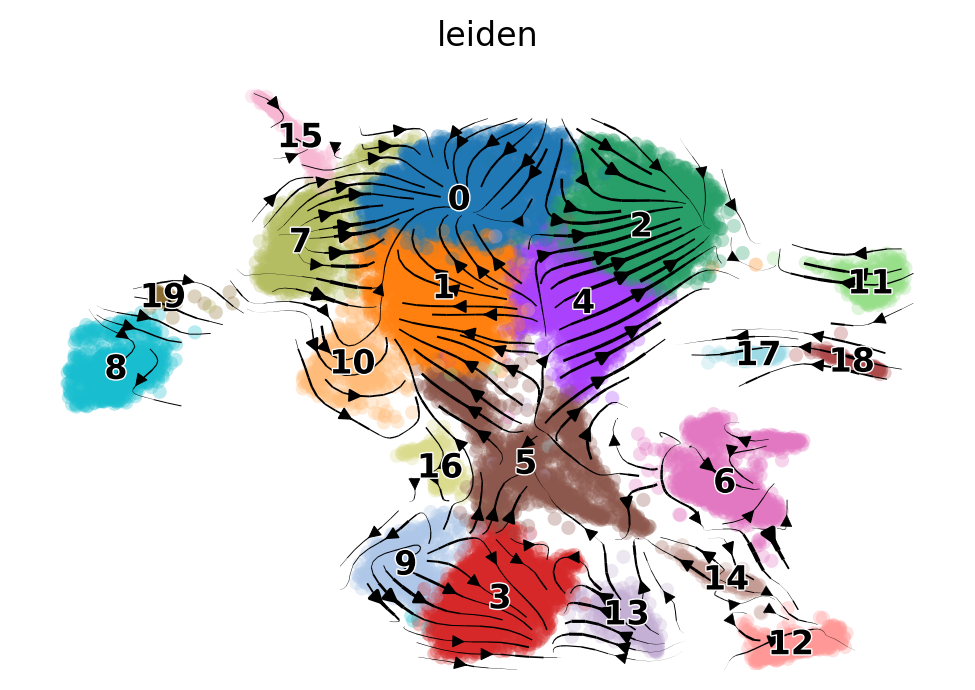

In [5]:
scv.pp.moments(adata_concat,use_rep='X_pca_harmony')
scv.tl.recover_dynamics(adata_concat)
scv.tl.velocity(adata_concat,mode='dynamical')
# scv.tl.velocity(adata_concat,groups=['VEH4','VEH24'],groupby='batch',mode='dynamical')
# scv.tl.velocity(adata_concat,groups=['TAM4','TAM24'],groupby='batch',mode='dynamical')
# scv.tl.velocity(adata_concat,groups=['mSOL','H2B'],groupby='batch',mode='dynamical')
# scv.tl.velocity(adata_concat,groups=['VEH4'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_concat,groups=['VEH24'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_concat,groups=['TAM4'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_concat,groups=['TAM24'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_concat,groups=['H2B'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_concat,groups=['mSOL'],groupby='batch',mode='deterministic')
scv.tl.velocity_graph(adata_concat)
scv.pl.velocity_embedding_stream(adata_concat,basis='umap',color=['leiden'])

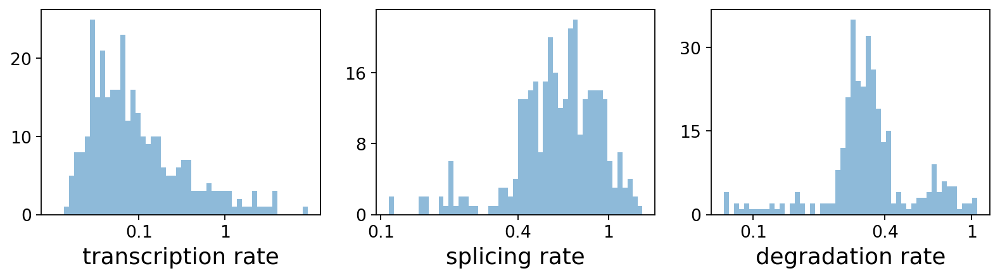

computing terminal states
    identified 4 regions of root cells and 2 regions of end points .
    finished (0:00:05) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:07) --> added 
    'latent_time', shared time (adata.obs)


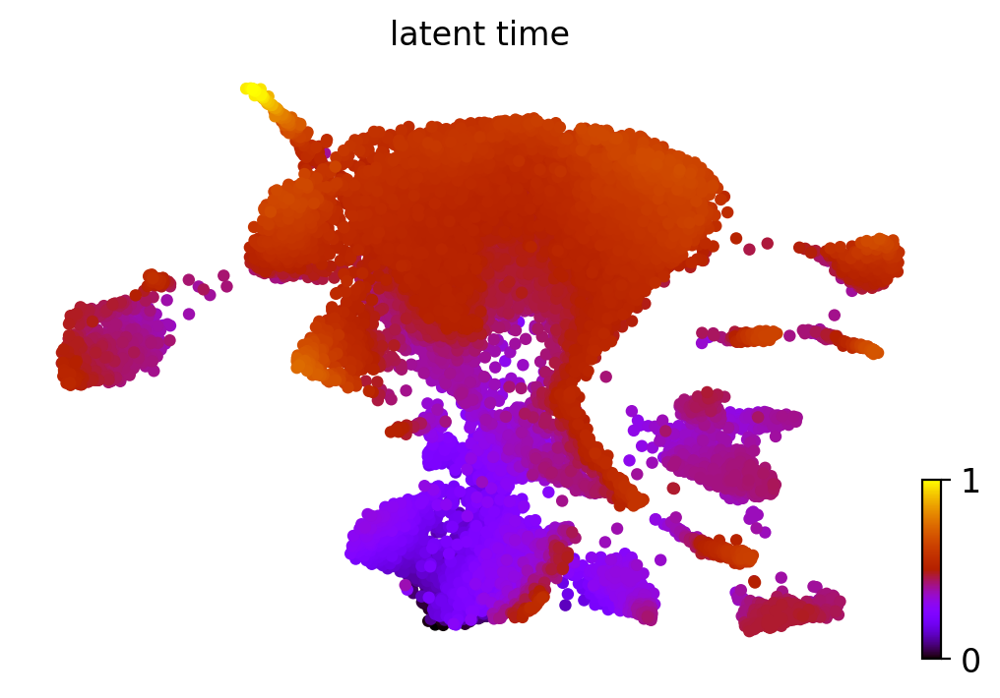

testing for differential kinetics
    finished (0:01:30) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pval_kinetics', p-values of differential kinetics (adata.var)
computing velocities
    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:02:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [6]:
# rcParams['figure.figsize'] = 10, 10
# scv.tl.paga(adata_concat, groups='leiden')
# scv.pl.paga(adata_concat, basis='umap', size=5, alpha=.25,
#             min_edge_width=2.5, node_size_scale=1)
df = adata_concat.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata_concat, 'fit*', dropna=True).head()

scv.tl.latent_time(adata_concat)
scv.pl.scatter(adata_concat, color='latent_time', color_map='gnuplot', size=80)
top_genes = adata_concat.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata_concat, var_names=top_genes, groupby='leiden')
scv.tl.velocity(adata_concat, diff_kinetics=True)
scv.tl.velocity_graph(adata_concat)

ranking genes by cluster-specific likelihoods
    finished (0:00:13) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)
           0              1        2       3        4              5        6  \
0       Myh1           Myh1     Tpm3    Myh4     Tpm3           Tpm3   Shank3   
1    Gm28653          Mylpf    Tnnt1    Ebf1     Car3          Tnnt1   Adgrl4   
2      Mylpf        Gm28653    Tnni1     Maf     Myl2        Gm28653     Cdh5   
3       Myl3          Fabp3  Gm28653    Tnxb    Tnnt1          Mylpf    Plcb1   
4    Gm34455        Gm34455     Car3   Mylk4    Tnni1           Myh1      Erg   
5      Fabp3          Csrp3    Rspo3   Fndc1  Gm28653            Mme    Nova2   
6      Csrp3        Adamts1   Sptbn1   Wipf1    Tnnc1        Gm34455   Rassf9   
7      Rps20          Rps20     Myl3  Col5a1   Sptbn1          Tnni1   Ablim3   
8      Resf1          Xirp2     Mhrt   Sulf1     Myl3          Ncam1   Adgrf5   
9       Nrp1          Resf1    Tnnc1   Mss5

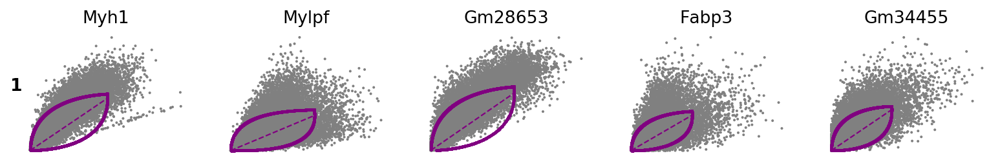

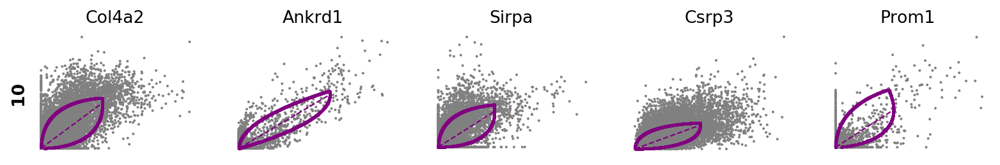

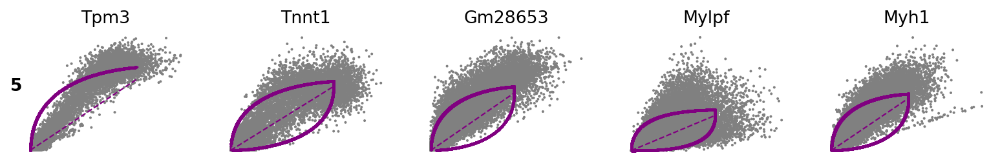

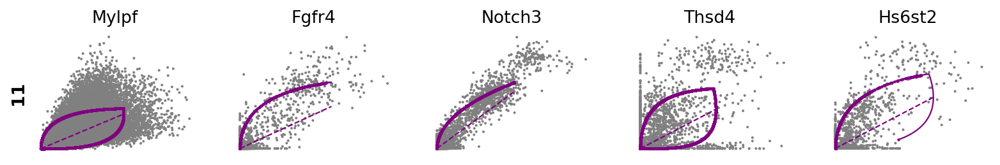

In [10]:
# rcParams['figure.figsize'] = 5, 5
# idx1 = adata_concat.obs["batch"]=="mSOL"
# idx2 = adata_concat.obs["batch"]=="H2B"
# print(sum(idx1))
# print(sum(idx2))
# print(sum(idx1+idx2))
# SED = adata_concat[idx1].copy()
# scv.tl.paga(SED, groups='leiden')
# scv.pl.paga(SED, basis='umap', size=5, alpha=.5,
#             min_edge_width=2.5, node_size_scale=1.25,save="_Sedentary")
top_genes = adata_concat.var['fit_likelihood'].sort_values(ascending=False).index
# scv.pl.scatter(adata_concat, basis=top_genes[:15], ncols=5, frameon=False)
scv.tl.rank_dynamical_genes(adata_concat, groupby='leiden')
df = scv.get_df(adata_concat, 'rank_dynamical_genes/names')
print(df.head(15))
for cluster in ['1', '10', '5', '11']:
    scv.pl.scatter(adata_concat, df[cluster][:5], ylabel=cluster, frameon=False)

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__V4.png


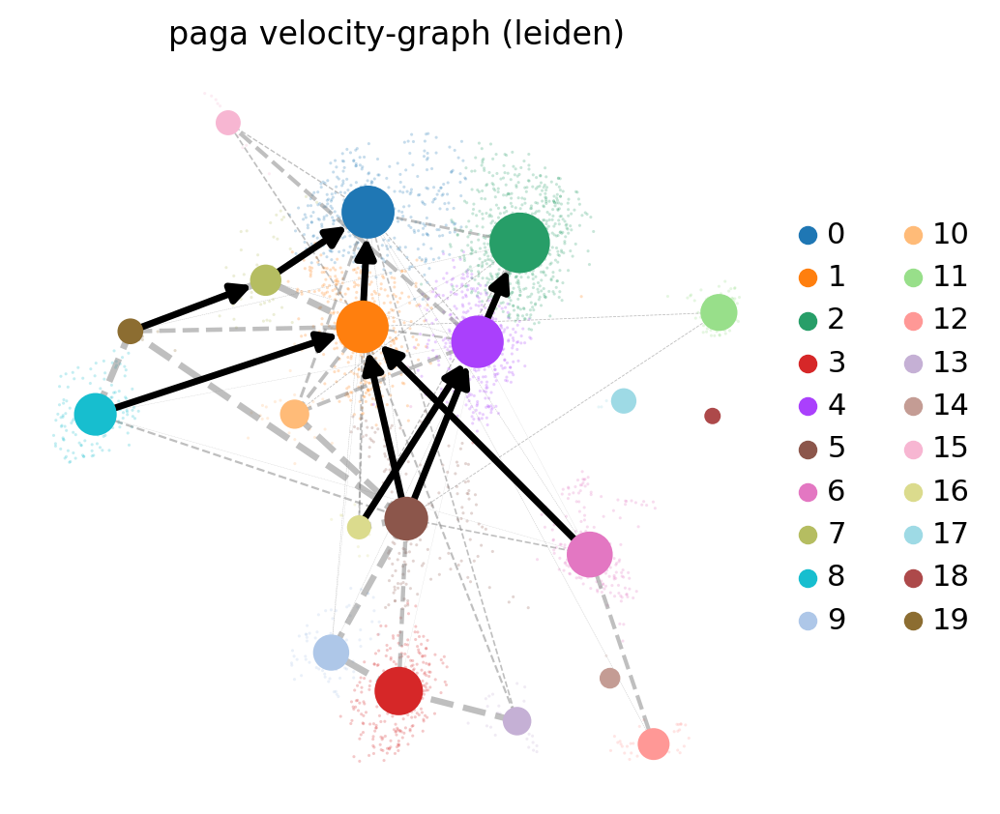

In [52]:
V4 = adata_concat[adata_concat.obs["batch"]=="VEH4"].copy()
scv.tl.paga(V4, groups='leiden')
scv.pl.paga(V4, basis='umap', size=5, alpha=.25,
            min_edge_width=2.5, node_size_scale=1,save="_V4")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__V24.png


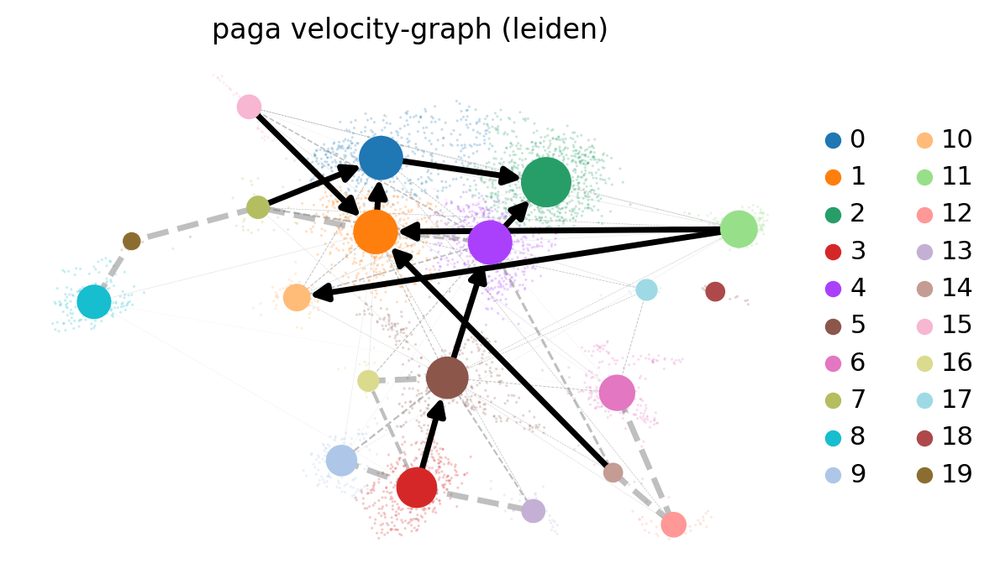

ranking genes by cluster-specific likelihoods
    finished (0:00:02) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)
          0              1        2       3        4        5        6  \
0   Gm28653            Maf     Tpm3    Myh4     Tpm3    Tnnt1   Shank3   
1      Myh1          Mylk4    Tnnt1     Maf     Car3     Tpm3     Nav1   
2     Mylpf           Myh1    Tnni1   Mylk4    Tnnt1     Car3   Rassf9   
3   Gm34455          Mylpf  Gm28653   Pvalb     Myl2  Gm28653   Adgrl4   
4      Myl3        Gm28653     Car3    Ebf1    Tnni1    Mylpf    Itga1   
5     Tnnt1          Pvalb    Rspo3   Fndc1  Gm28653     Myh1    Plcb1   
6     Fabp3        Gm34455   Sptbn1   Fstl1    Tnnc1      Mme    Myo1d   
7      Nrp1          Fabp3     Myl3    Ddr2     Myl3    Ncam1   Samd12   
8     Csrp3           Nrp1     Mhrt    Tnxb   Sptbn1  Gm34455    Nova2   
9     Hspb1           Psd3    Tnnc1    Psd3    Ncam1   Sptbn1   Adgrf5   
10    Rps21          Csrp3      Sln    

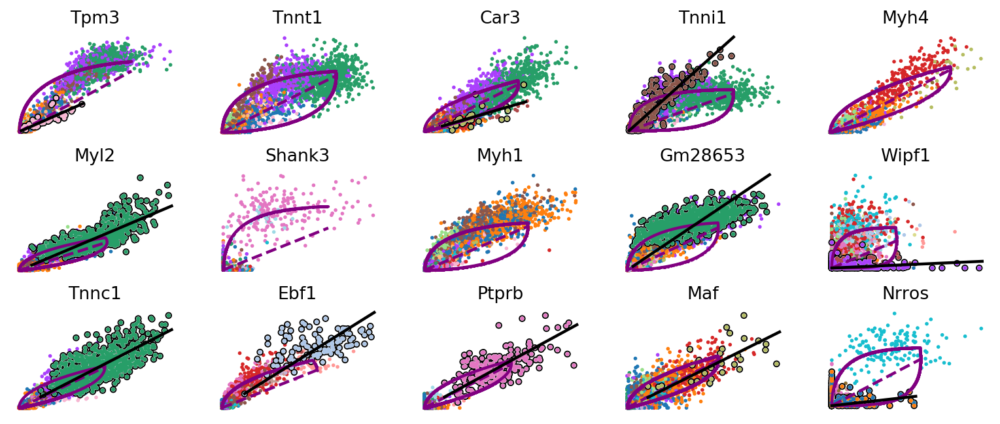

In [14]:
V24 = adata_concat[adata_concat.obs["batch"]=="VEH24"].copy()
scv.tl.paga(V24, groups='leiden')
scv.pl.paga(V24, basis='umap', size=5, alpha=.25,
            min_edge_width=2.5, node_size_scale=1,save="_V24")
top_genes = V24.var['fit_likelihood'].sort_values(ascending=False).index
scv.tl.rank_dynamical_genes(V24, groupby='leiden')
df = scv.get_df(V24, 'rank_dynamical_genes/names')
print(df.head(15))


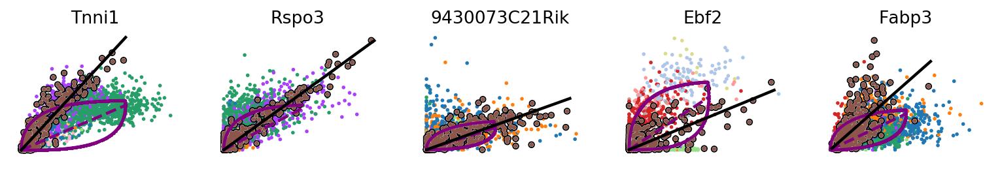

In [23]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
# scv.pl.scatter(V24, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics', **kwargs)
# var_names = ['Tnnt1', 'Tpm3', 'Car3', 'Mylpf']
var_names = ['Tnni1','Rspo3','9430073C21Rik','Ebf2','Fabp3']
# scv.get_df(V24[:, var_names], ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2)
# scv.get_df(V24, ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2).to_csv("test.csv")
scv.pl.scatter(V24, basis=var_names, ncols=5, add_outline='fit_diff_kinetics', **kwargs)

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__T4.png


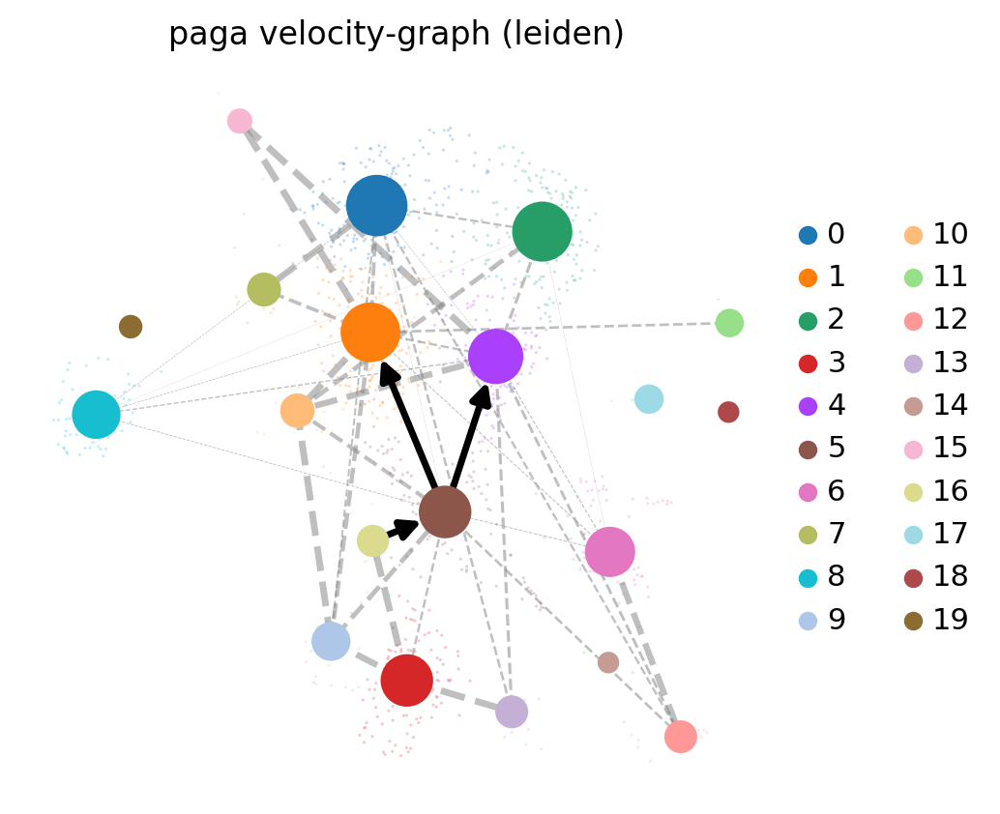

In [54]:
T4 = adata_concat[adata_concat.obs["batch"]=="TAM4"].copy()
scv.tl.paga(T4, groups='leiden')
scv.pl.paga(T4, basis='umap', size=5, alpha=.25,
            min_edge_width=2.5, node_size_scale=1,save="_T4")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__T24.png


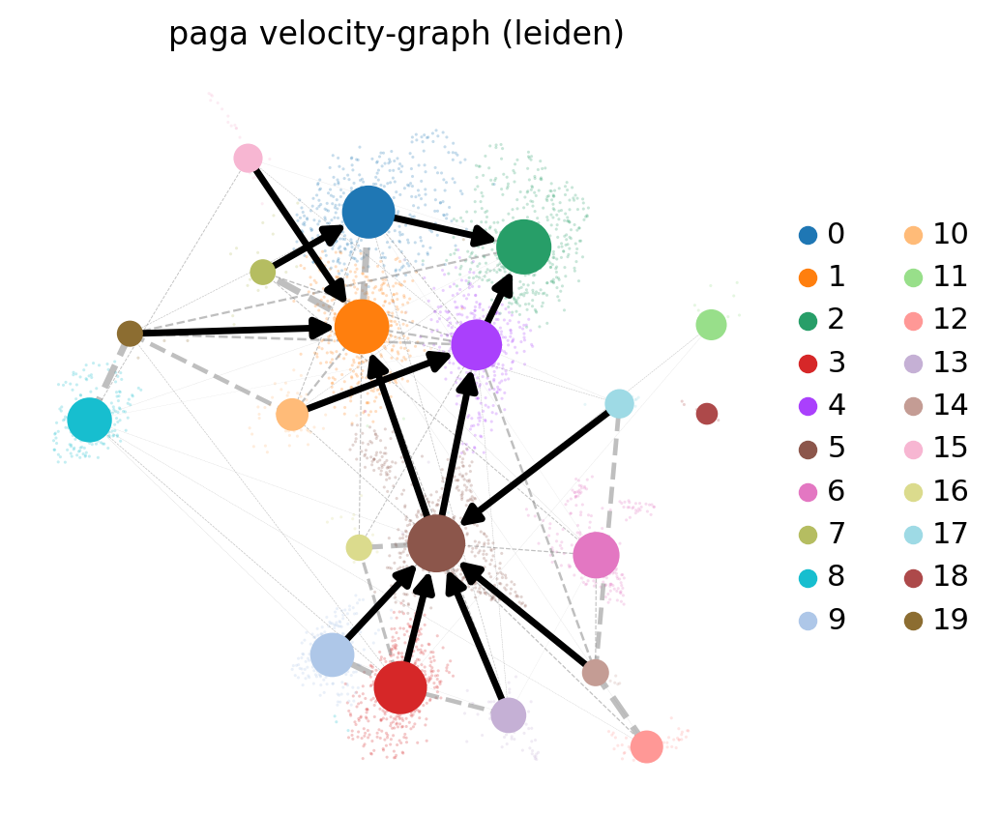

In [55]:
T24 = adata_concat[adata_concat.obs["batch"]=="TAM24"].copy()
scv.tl.paga(T24, groups='leiden')
scv.pl.paga(T24, basis='umap', size=5, alpha=.25,
            min_edge_width=2.5, node_size_scale=1,save="_T24")

In [58]:
results_file = 'Data/Harmony_integrated_5month_trial2_leiden_R.h5ad'
adata_saving_progress1=scv.read(results_file)
adata_subclust=adata_saving_progress1.copy()
# idx0 = adata_subclust.obs["batch"]!="H2B"
# adata_subclust=adata_subclust[idx0].copy()
# idx0 = adata_subclust.obs["batch"]!="mSOL"
# adata_subclust=adata_subclust[idx0].copy()
# print(adata_subclust.obs['batch'])
# sc.tl.dendrogram(adata_subclust,groupby='leiden')
# sc.pl.dendrogram(adata_subclust,groupby='leiden')
# sc.tl.rank_genes_groups(adata_subclust,'leiden',method='wilcoxon',n_genes=200)
# rcParams['figure.figsize'] = 5, 7
# rcParams['font.size'] = 12
# marker_genes = ['Myh1','Myh2','Myh4','Myh7']
# sc.pl.stacked_violin(adata_subclust,marker_genes,groupby='leiden',rotation=90)
# sc.pl.rank_genes_groups_stacked_violin(adata_subclust,n_genes=3)

# sc.pl.rank_genes_groups_heatmap(adata_subclust, n_genes=3,swap_axes=False, 
#                                 vmin=-3, vmax=3,cmap='bwr',groupby='leiden',
#                                 show_gene_labels=True,save="_subcluster_heatmap")

# sc.pl.umap(adata_subclust, color=marker_genes, ncols=1)

computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:34:18) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:56) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:26) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:19) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:19) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:18) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:18) --> added 
    'velocity', velocity vectors for eac

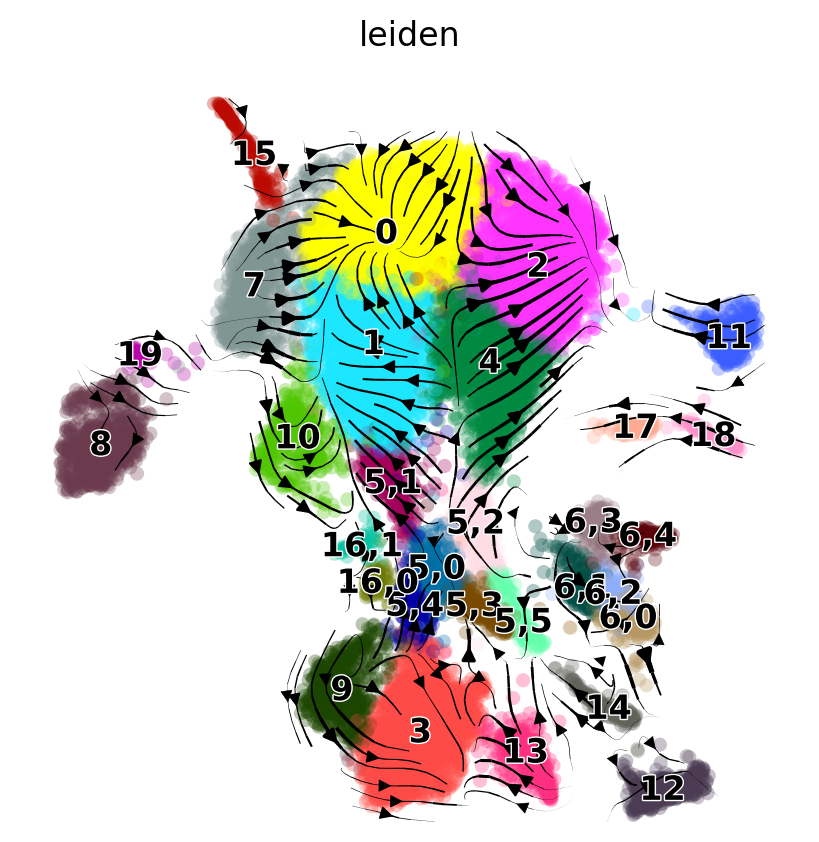

In [59]:
# grp = adata_subclust.obs['leiden']
# grp=[*set(grp)]
# grp = np.setdiff1d(grp,['8','19','','6,0','6,1','6,2','6,3','17','18','11'])
# sc.pp.neighbors(adata_subclust,use_rep='X_pca_harmony',n_neighbors=30, n_pcs=50)
# sc.tl.leiden(adata_subclust,resolution=1)
# sc.tl.paga(adata_subclust)
# sc.pl.paga(adata_subclust, plot=False)
# sc.tl.umap(adata_subclust, init_pos='paga')
scv.pp.moments(adata_subclust,use_rep='X_pca_harmony')
scv.tl.recover_dynamics(adata_subclust)
# scv.tl.velocity(adata_subclust,mode='dynamical')
# scv.tl.velocity(adata_subclust,mode='dynamical',groups=grp,groupby=['leiden'])
# scv.tl.velocity(adata_subclust,groups=['VEH4','VEH24','TAM4','TAM24'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_subclust,groups=['VEH4','VEH24'],groupby='batch',mode='dynamical')
# scv.tl.velocity(adata_subclust,groups=['TAM4','TAM24'],groupby='batch',mode='dynamical')
# # scv.tl.velocity(adata_subclust,groups=['mSOL','H2B'],groupby='batch',mode='dynamical') #trial1
# scv.tl.velocity(adata_subclust,groups=['mSOL'],groupby='batch',mode='dynamical') #trial2
# scv.tl.velocity(adata_subclust,groups=['H2B'],groupby='batch',mode='dynamical') #trial2
scv.tl.velocity(adata_subclust,groups=['0','1','2','4','15','7','10','11'],groupby='leiden',mode='dynamical')
scv.tl.velocity(adata_subclust,groups=['8','19'],groupby='leiden',mode='dynamical')
scv.tl.velocity(adata_subclust,groups=['16,0','16,1','5,0','5,1','5,2','5,3','5,4','5,5','3','9','13'],groupby='leiden',mode='dynamical') #trial1
scv.tl.velocity(adata_subclust,groups=['6,0','6,1','6,2','6,3','6,4'],groupby='leiden',mode='dynamical')
scv.tl.velocity(adata_subclust,groups=['14','12'],groupby='leiden',mode='dynamical')
scv.tl.velocity(adata_subclust,groups=['17','18'],groupby='leiden',mode='dynamical')
# scv.tl.velocity(adata_subclust,groups=['VEH4'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_subclust,groups=['VEH24'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_subclust,groups=['TAM4'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_subclust,groups=['TAM24'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_subclust,groups=['H2B'],groupby='batch',mode='deterministic')
# scv.tl.velocity(adata_subclust,groups=['mSOL'],groupby='batch',mode='deterministic')
scv.tl.velocity_graph(adata_subclust)
scv.pl.velocity_embedding_stream(adata_subclust,basis='umap',color=['leiden'])

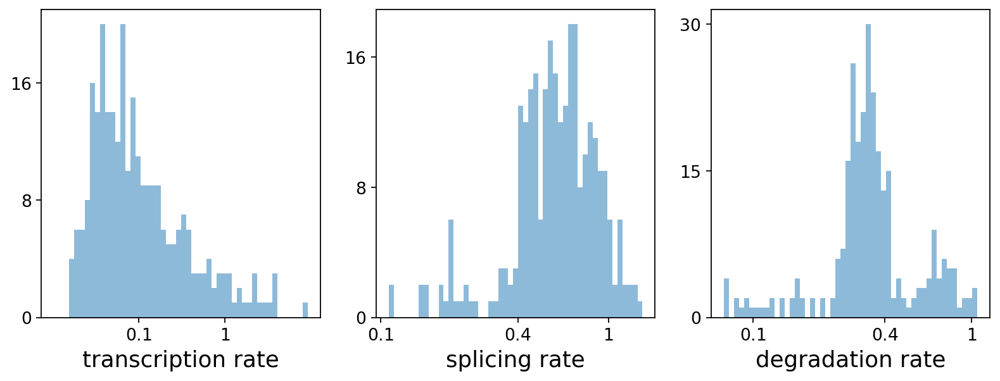

computing latent time using root_cells as prior
    finished (0:00:09) --> added 
    'latent_time', shared time (adata.obs)


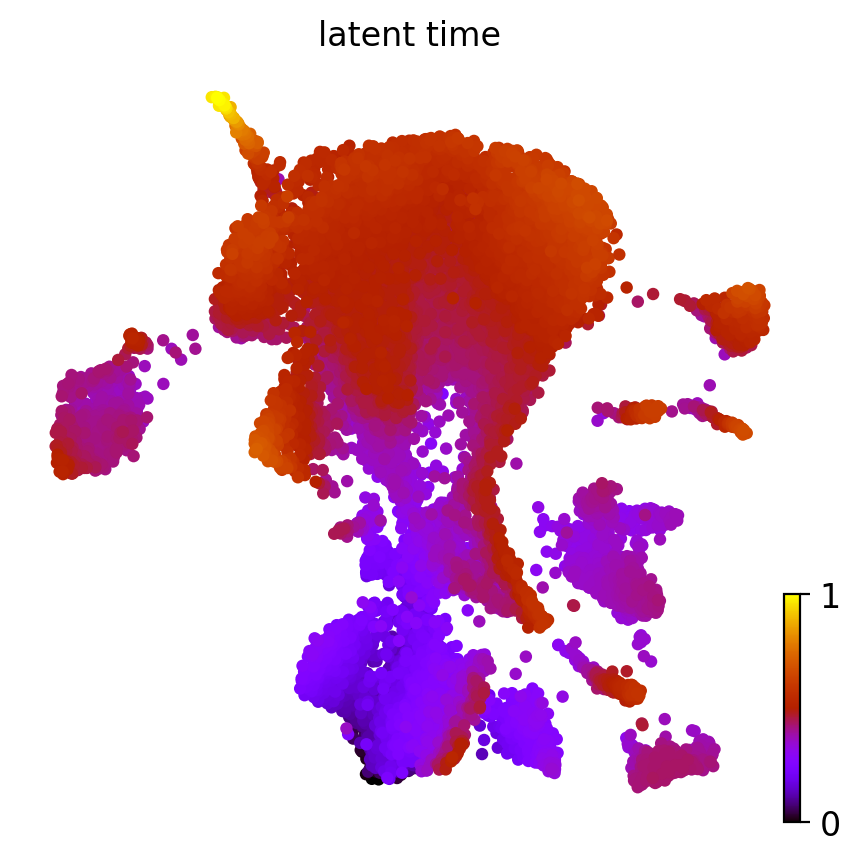

testing for differential kinetics
    finished (0:01:54) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pval_kinetics', p-values of differential kinetics (adata.var)


In [60]:
df = adata_subclust.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata_subclust, 'fit*', dropna=True).head()

scv.tl.latent_time(adata_subclust)
scv.pl.scatter(adata_subclust, color='latent_time', color_map='gnuplot', size=80)

# top_genes = adata_subclust.var['fit_likelihood'].sort_values(ascending=False).index[:300]
# scv.pl.heatmap(adata_subclust, var_names=top_genes, sortby='latent_time', col_color='leiden', n_convolve=100)

# top_genes = adata_subclust.var['fit_likelihood'].sort_values(ascending=False).index
# scv.pl.scatter(adata_subclust, basis=top_genes[:15], ncols=5, frameon=False)

# var_names = ['Pax7', 'Myh1', 'Myh4', 'Prom1']
# scv.pl.scatter(adata_subclust, var_names, frameon=False)
# scv.pl.scatter(adata_subclust, x='latent_time', y=var_names, frameon=False)

# scv.tl.rank_dynamical_genes(adata_subclust, groupby='leiden')
# df = scv.get_df(adata_subclust, 'rank_dynamical_genes/names')
# df.head(5)

# for cluster in ['0', '1', '2', '4']:
#     scv.pl.scatter(adata_subclust, df[cluster][:5], ylabel=cluster, frameon=False)

# var_names = ['Myh1', 'Myf5', 'Pax7', 'Cd34']
# scv.tl.differential_kinetic_test(adata_subclust, var_names=var_names, groupby='leiden')

# scv.get_df(adata_subclust[:, var_names], ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2)

# kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
# scv.pl.scatter(adata_subclust, basis=var_names, add_outline='fit_diff_kinetics', **kwargs)

# diff_clusters=list(adata_subclust[:, var_names].var['fit_diff_kinetics'])
# scv.pl.scatter(adata_subclust, legend_loc='right', size=60, title='diff kinetics',
#                add_outline=diff_clusters, outline_width=(.8, .2))

top_genes = adata_subclust.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata_subclust, var_names=top_genes, groupby='leiden')
# scv.pl.scatter(adata_subclust, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics', **kwargs)
# scv.pl.scatter(adata_subclust, basis=top_genes[15:30], ncols=5, add_outline='fit_diff_kinetics', **kwargs)


In [61]:
scv.tl.velocity(adata_subclust, diff_kinetics=True)
scv.tl.velocity_graph(adata_subclust)
# scv.pl.velocity_embedding_stream(adata_subclust,basis='umap',color='leiden')

computing velocities
    finished (0:00:07) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:02:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


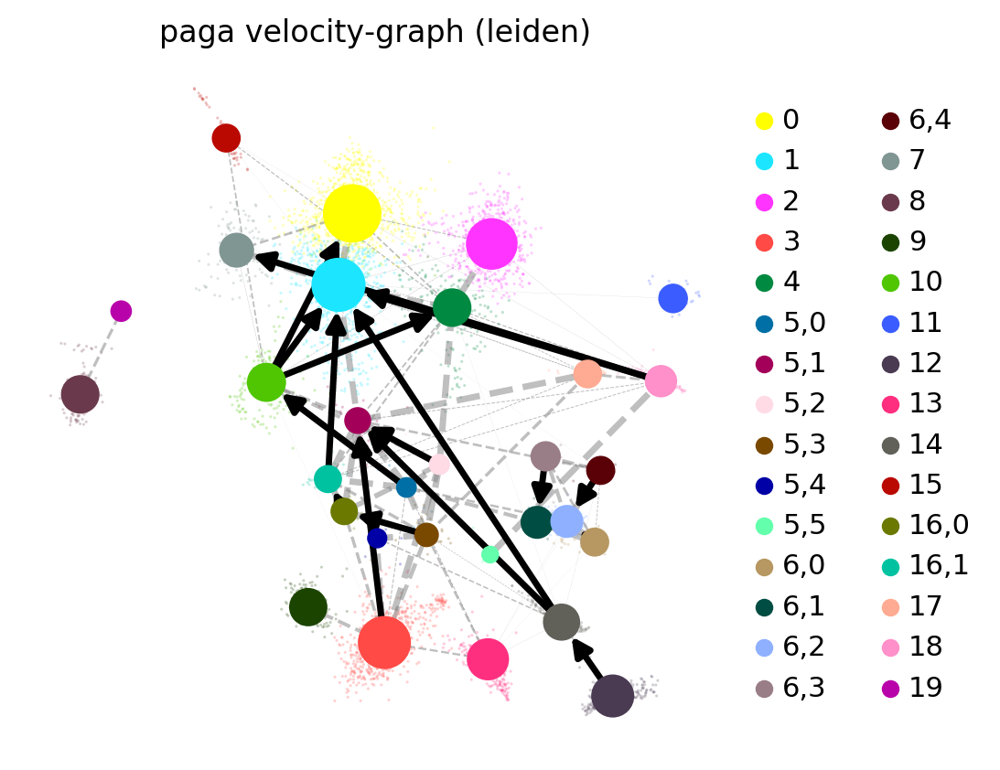

In [1061]:
rcParams['figure.figsize'] = 5, 5
SED = adata_subclust[adata_subclust.obs["batch"]=="mSOL"].copy()
# SED = adata_subclust[adata_subclust.obs["batch"]=="H2B"].copy()
scv.tl.paga(SED, groups='leiden')
scv.pl.paga(SED, basis='umap', size=5, alpha=.25,
            min_edge_width=2.5, node_size_scale=1,save="_SED")
# SED = adata_subclust[(adata_subclust.obs["batch"]=="mSOL") | (adata_subclust.obs["batch"]=="H2B")].copy()
# scv.pl.paga(SED, basis='umap', size=5, alpha=.25,
#             min_edge_width=2.5, node_size_scale=1)

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__V4.png


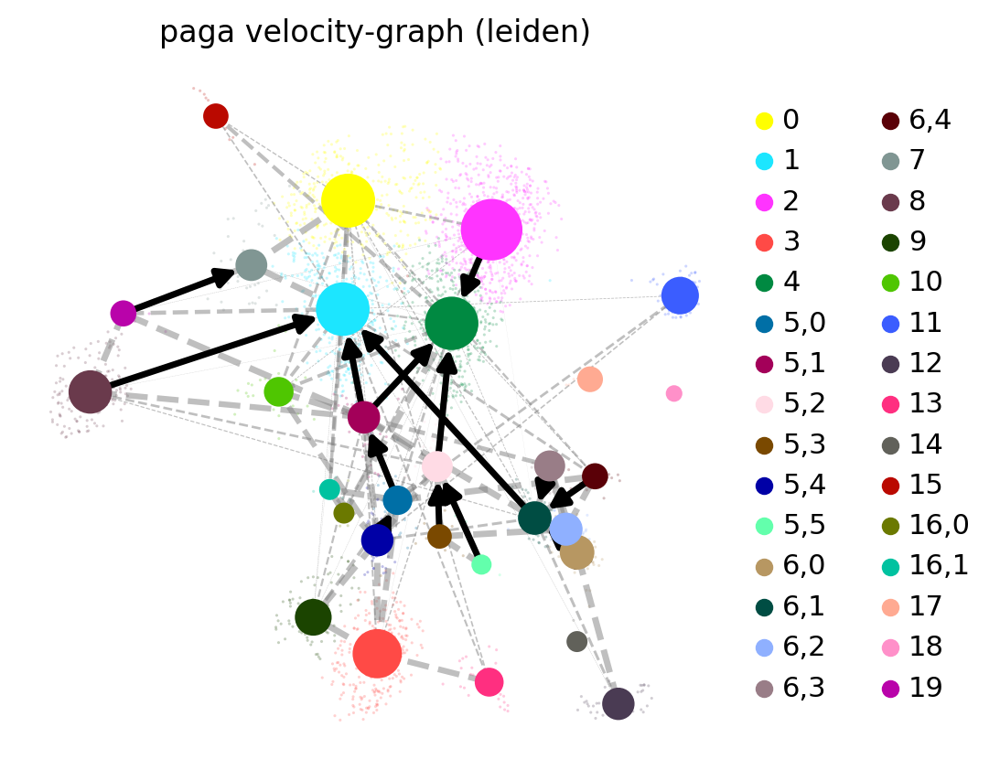

In [1049]:
V4 = adata_subclust[adata_subclust.obs["batch"]=="VEH4"].copy()
scv.tl.paga(V4, groups='leiden')
scv.pl.paga(V4, basis='umap', size=5, alpha=.25,
            min_edge_width=2.5, node_size_scale=1,save="_V4")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__V24.png


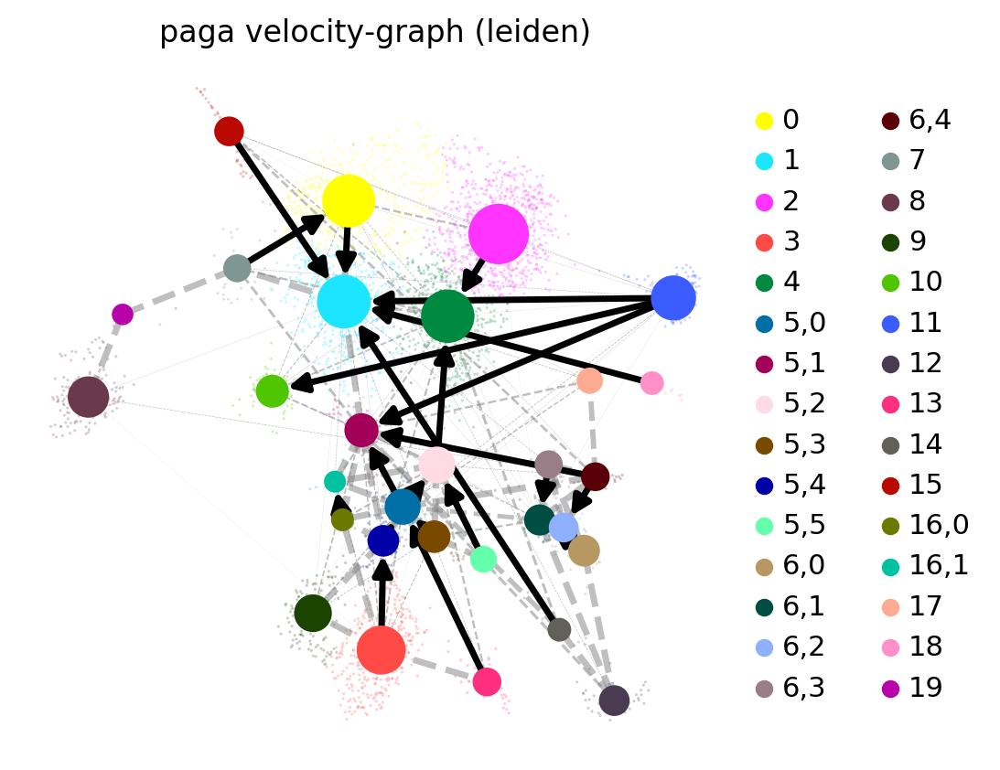

In [1050]:
V24 = adata_subclust[adata_subclust.obs["batch"]=="VEH24"].copy()
scv.tl.paga(V24, groups='leiden')
scv.pl.paga(V24, basis='umap', size=5, alpha=.25,
            min_edge_width=2.5, node_size_scale=1,save="_V24")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__T4.png


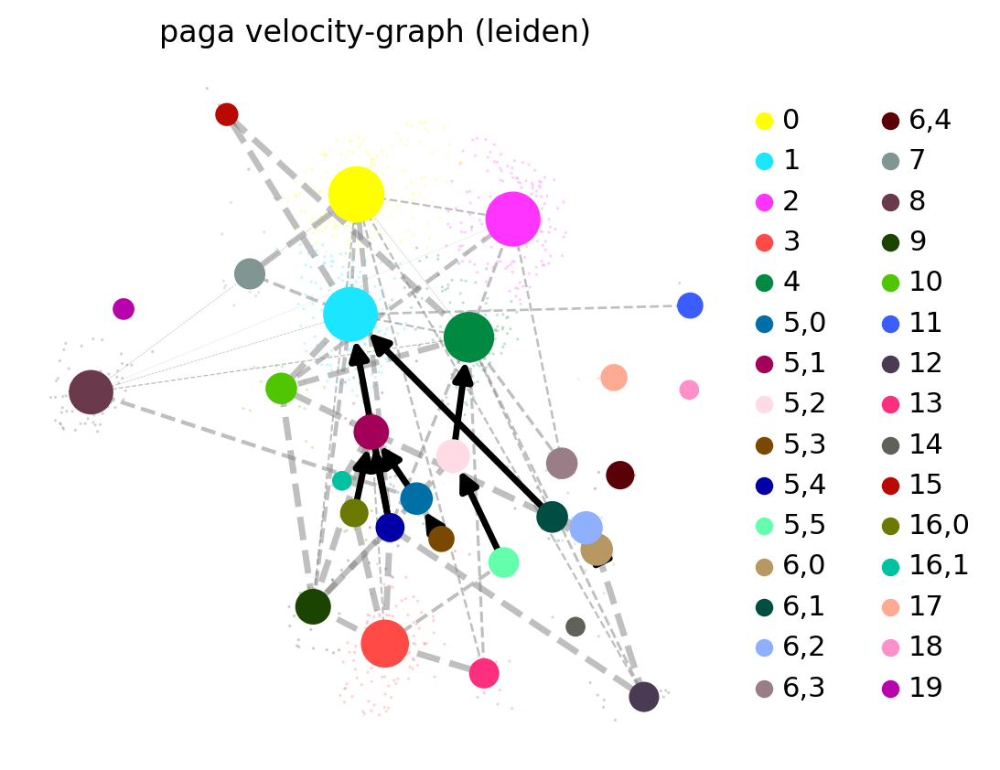

In [1051]:
T4 = adata_subclust[adata_subclust.obs["batch"]=="TAM4"].copy()
scv.tl.paga(T4, groups='leiden')
scv.pl.paga(T4, basis='umap', size=5, alpha=.25,
            min_edge_width=2.5, node_size_scale=1,save="_T4")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__T24.png


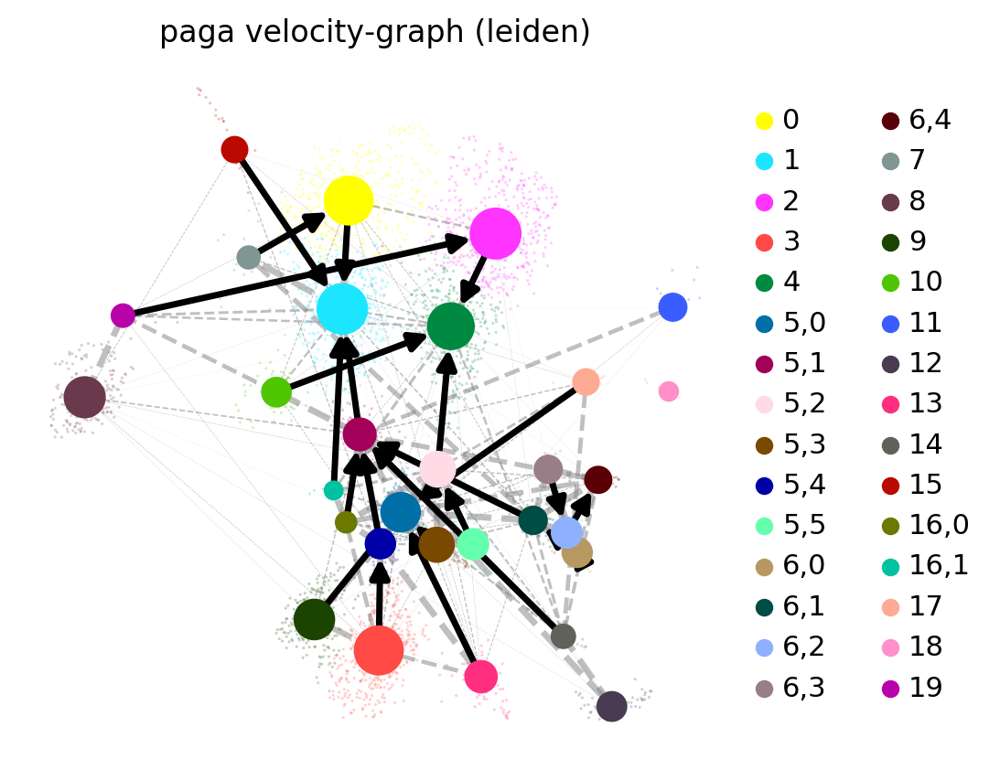

In [1052]:
T24 = adata_subclust[adata_subclust.obs["batch"]=="TAM24"].copy()
scv.tl.paga(T24, groups='leiden')
scv.pl.paga(T24, basis='umap', size=5, alpha=.25,
            min_edge_width=2.5, node_size_scale=1,save="_T24")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:05) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


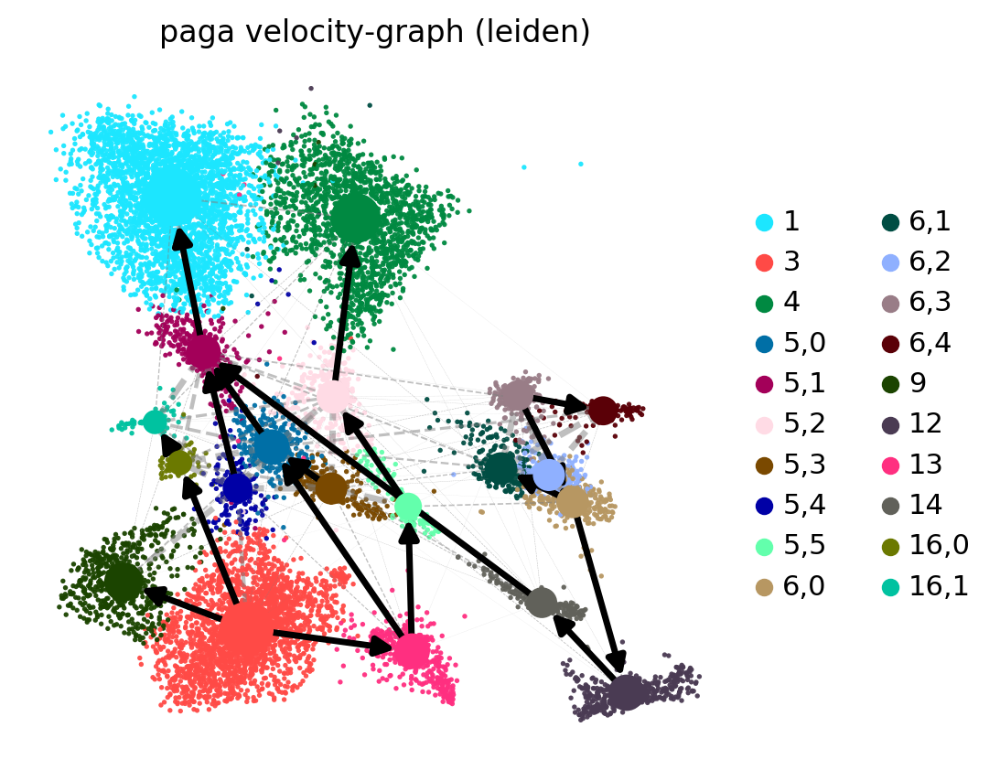

In [1102]:
ambi = adata_subclust[adata_subclust.obs["leiden"].isin(['3','9','13','12','14',
                                                         '5,0','5,1','5,2','5,3','5,4','5,5',
                                                         '1','4','16,0','16,1',
                                                         '6,0','6,1','6,2','6,3','6,4'])].copy()
scv.tl.paga(ambi, groups='leiden')
scv.pl.paga(ambi, basis='umap', size=15, alpha=.95, 
            min_edge_width=2.5, node_size_scale=1)
# scv.pl.paga(T24[T24.obs['leiden'] in ['5,0','5,1','5,2','5,3','5,4','5,5']], basis='umap', size=5, alpha=.25,
#             min_edge_width=2.5, node_size_scale=1)


running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


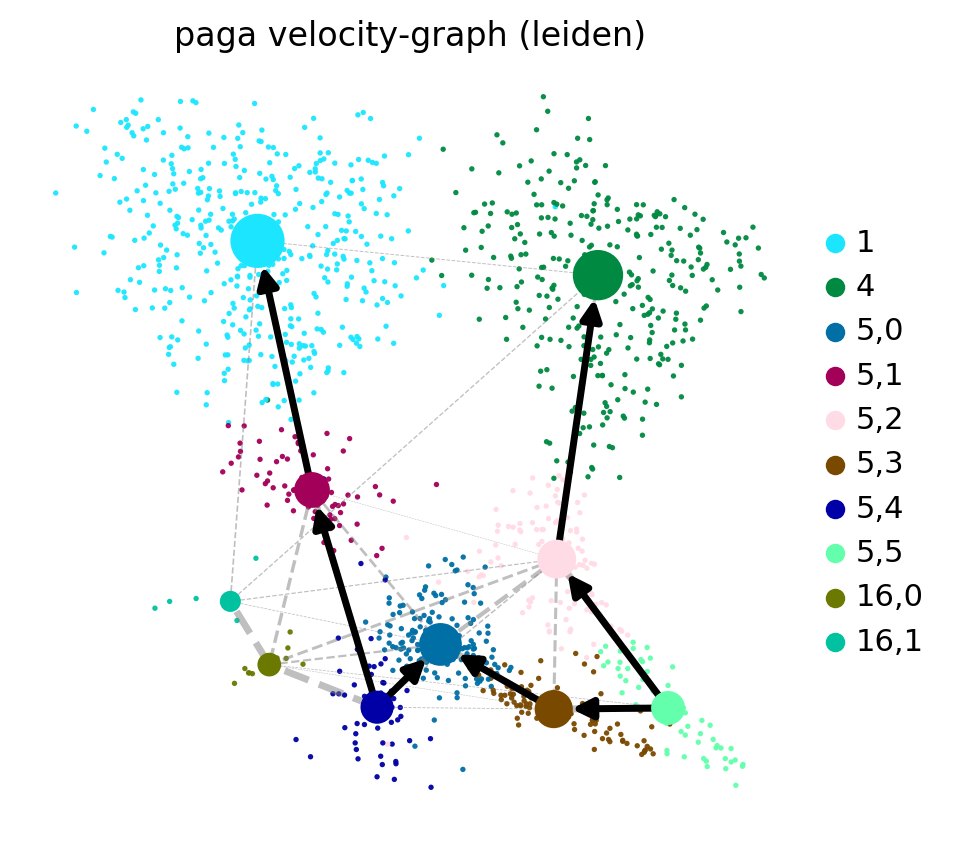

In [77]:
rcParams['figure.figsize'] = 5, 5
# ss_clusters=['3','9','13','12','14','11',
#              '5,0','5,1','5,2','5,3','5,4','5,5',
#              '1','4','16,0','16,1',
#              '6,0','6,1','6,2','6,3','6,4']
# ss_clusters=['5,0','5,1','5,2','5,3','5,4','5,5',
#              '1','4','16,0','16,1',
#              '6,0','6,1','6,2','6,3','6,4']
# ss_clusters=['3','9','13','12','14',
#              '5,0','5,1','5,2','5,3','5,4','5,5',
#              '1','4','16,0','16,1']
# ss_clusters=['12','14','5,0','5,1','5,2','5,3','5,4','5,5','11',
#              '6,0','6,1','6,2','6,3','6,4','3','9','13','1','4','0','2']
# ss_clusters=['5,0','5,1','5,2','5,3','5,4','5,5','11',
#              '1','4','0','2','7','10','15']
# ss_clusters=['5,0','5,1','5,2','5,3','5,4','5,5','11',
#              '3','9','13','1','4','0','2','7','10','15']
# ss_clusters=['3','9','13',
#              '5,0','5,1','5,2','5,3','5,4','5,5',
#              '1','4','16,0','16,1']
ss_clusters=['5,0','5,1','5,2','5,3','5,4','5,5',
             '1','4','16,0','16,1']
ambi = adata_subclust[(adata_subclust.obs["batch"].isin(["TAM24"])) & 
                      (adata_subclust.obs["leiden"].isin(ss_clusters))].copy()
scv.tl.paga(ambi, groups='leiden')
scv.pl.paga(ambi, basis='umap', size=15, alpha=.95, 
            min_edge_width=2.5, node_size_scale=1)
# scv.pl.paga(ambi, basis='umap', size=15, alpha=.95, 
#             min_edge_width=2.5, node_size_scale=1,save="_subclusters_TAM24")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


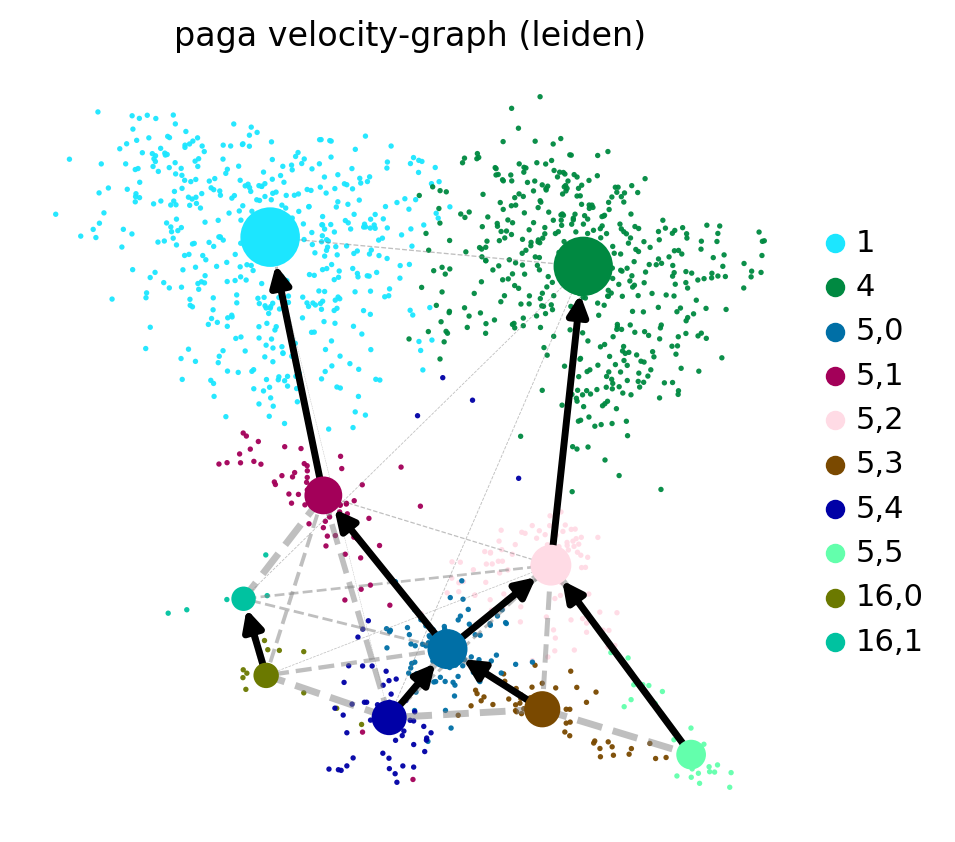

In [78]:
# ss_clusters=['5,0','5,1','5,2','5,3','5,4','5,5',
#              '1','4','16,0','16,1']
ambi = adata_subclust[(adata_subclust.obs["batch"].isin(["VEH24"])) & 
                      (adata_subclust.obs["leiden"].isin(ss_clusters))].copy()
scv.tl.paga(ambi, groups='leiden')
scv.pl.paga(ambi, basis='umap', size=15, alpha=.95, 
            min_edge_width=2.5, node_size_scale=1)
#             min_edge_width=2.5, node_size_scale=1,save="_subclusters_VEH24")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__subclusters_VEH4.png


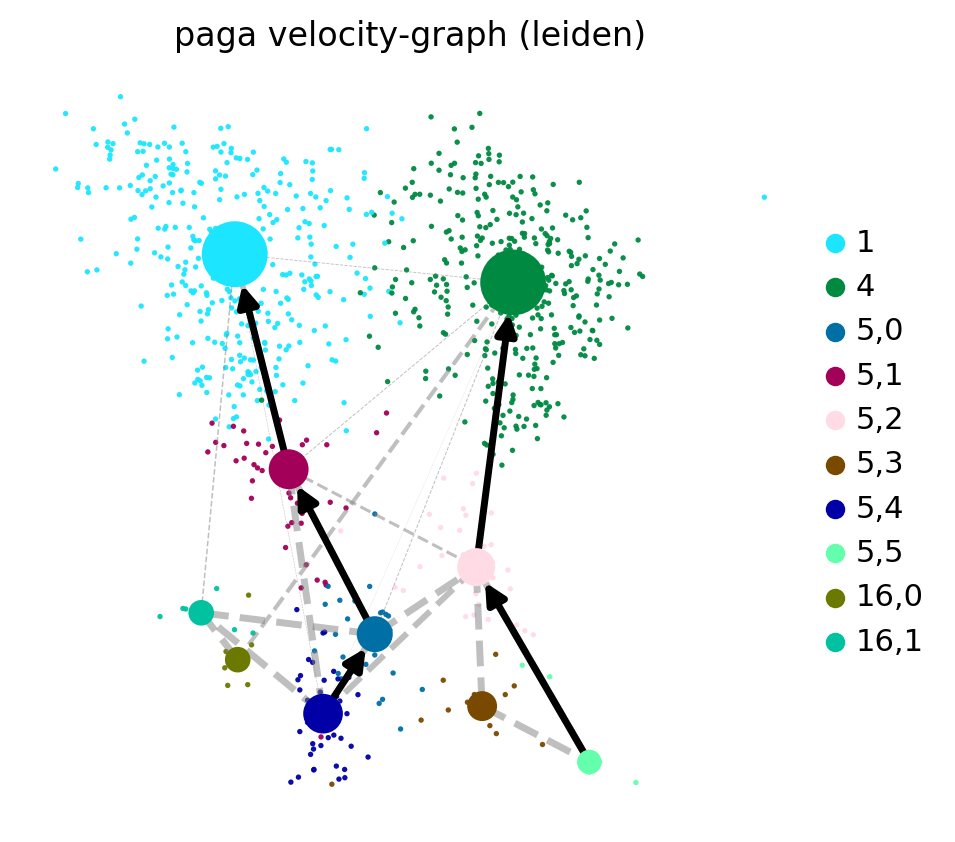

In [68]:
# ss_clusters=['5,0','5,1','5,2','5,3','5,4','5,5',
#              '1','4','16,0','16,1']
ambi = adata_subclust[(adata_subclust.obs["batch"]=="VEH4") & 
                      (adata_subclust.obs["leiden"].isin(ss_clusters))].copy()
scv.tl.paga(ambi, groups='leiden')
scv.pl.paga(ambi, basis='umap', size=15, alpha=.95, 
            min_edge_width=2.5, node_size_scale=1,save="_subclusters_VEH4")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo__subclusters_TAM4.png


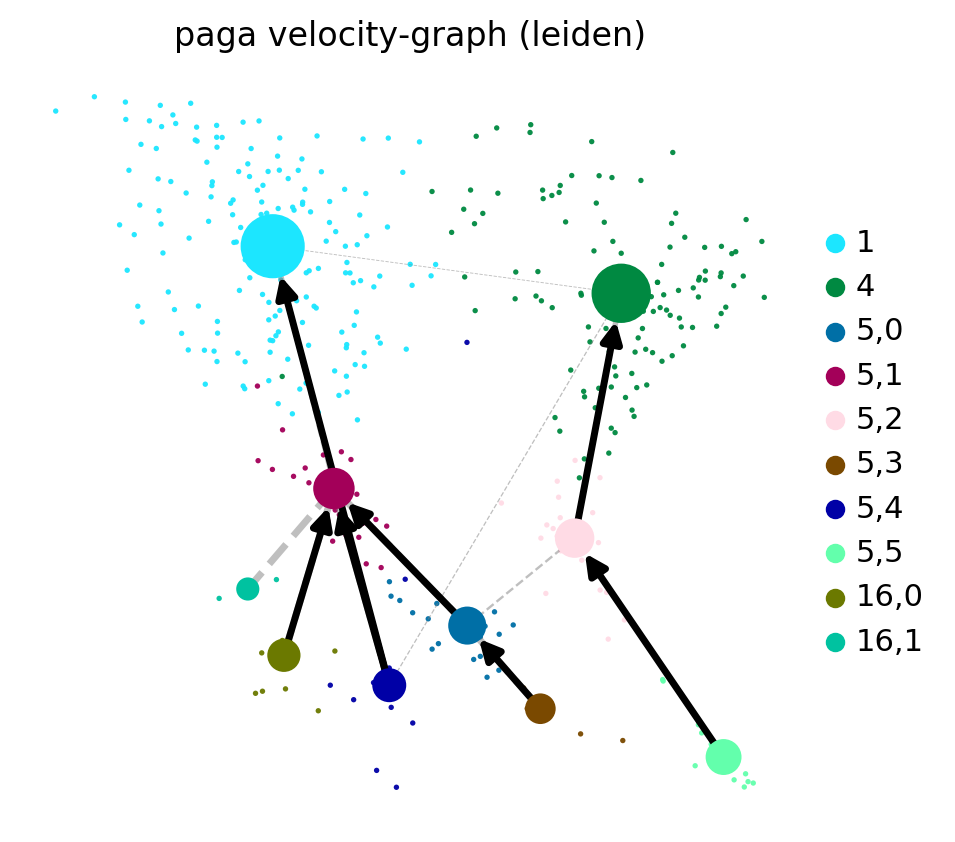

In [69]:
# ss_clusters=['5,0','5,1','5,2','5,3','5,4','5,5',
#              '1','4','16,0','16,1']
ambi = adata_subclust[(adata_subclust.obs["batch"]=="TAM4") & 
                      (adata_subclust.obs["leiden"].isin(ss_clusters))].copy()
scv.tl.paga(ambi, groups='leiden')
scv.pl.paga(ambi, basis='umap', size=15, alpha=.95, 
            min_edge_width=2.5, node_size_scale=1,save="_subclusters_TAM4")

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


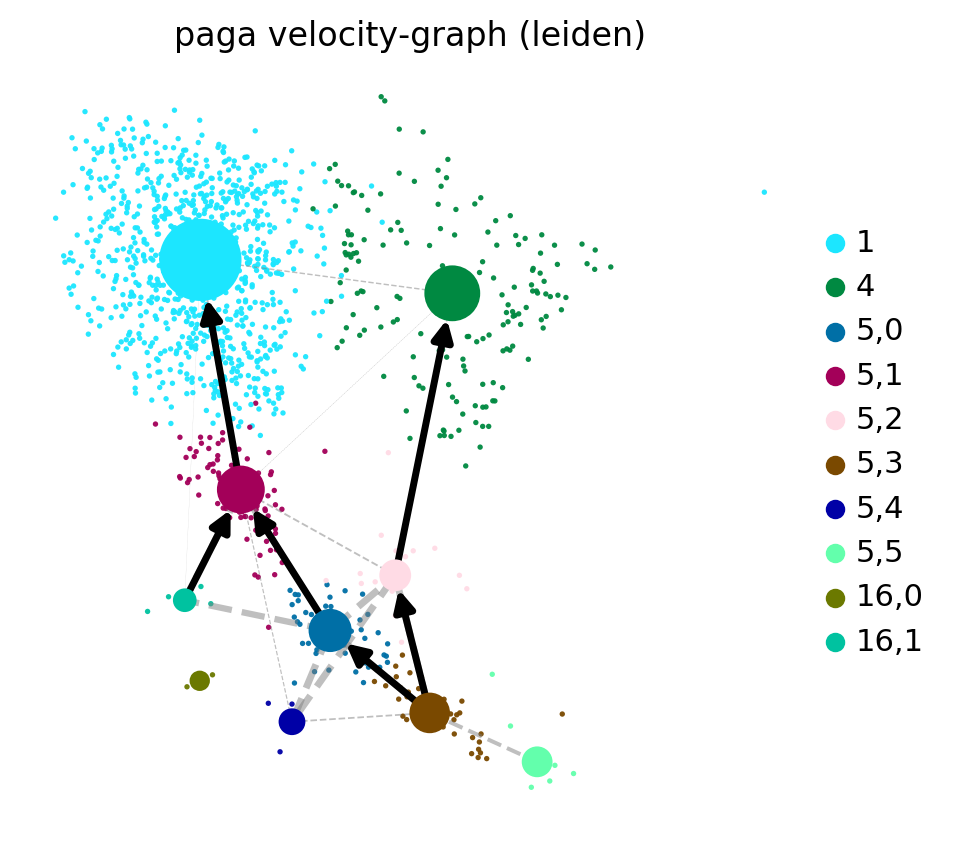

In [76]:
ambi = adata_subclust[(adata_subclust.obs["batch"].isin(["H2B"])) & 
                      (adata_subclust.obs["leiden"].isin(ss_clusters))].copy()
scv.tl.paga(ambi, groups='leiden')
scv.pl.paga(ambi, basis='umap', size=15, alpha=.95, 
            min_edge_width=2.5, node_size_scale=1)
#             min_edge_width=2.5, node_size_scale=1,save="_subclusters_mSOL")

# ambi = adata_subclust[(adata_subclust.obs["batch"]=="H2B") & 
#                       (adata_subclust.obs["leiden"].isin(ss_clusters))].copy()
# scv.tl.paga(ambi, groups='leiden')
# scv.pl.paga(ambi, basis='umap', size=15, alpha=.95, 
#             min_edge_width=2.5, node_size_scale=1,save="_subclusters_H2B")